In [547]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [548]:
# Importing Pandas and NumPy
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import RFE
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE   

In [549]:
# Importing the datasets
churn_data = pd.read_csv("C:\\churn_case_study\\data_set\\telecom_churn_data.csv")
churn_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [550]:
# Let's check the dimensions of the dataframe
churn_data.shape

(99999, 226)

In [551]:
# let's look at the statistical aspects of the dataframe
churn_data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.084581,0.914404,0.908764,0.890808,0.860968,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.650457,0.279772,0.287950,0.311885,0.345987,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,1.000000,1.000000,1.000000,1.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,1.000000,1.000000,1.000000,1.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


In [552]:
# Let's see the type of each column
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [553]:
churn_data.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

In [554]:
churn_data.columns.values

array(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6', 'arpu_7',
       'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8',
       'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8',
       'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9',
       'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8',
       'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7',
       'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6',
       'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6',
       'std_og_t2t

In [555]:
# This is the function which returns month wise column list for june, july, august, september and apart from these months also
# Input Parameter : data_frame -> type(data frame) A data frame containing the column name "6" or "jun"
# Output Paramter : june_Month, july_Month, august_Month, september_Month, rest_of_the_Month -> type(arrays) monthwise column 
# list
def monthWiseColumnList(data_frame):
    june_Month = []
    july_Month = []
    august_Month = [] 
    september_Month = [] 
    rest_of_the_Month =  []
    for singleColumn in data_frame.columns:
        if((singleColumn.find("_6") >=0) | (singleColumn.find("jun_") >=0)):
            june_Month.append(singleColumn)
        elif((singleColumn.find("_7") >=0) | (singleColumn.find("jul_") >=0)):
            july_Month.append(singleColumn)
        elif((singleColumn.find("_8") >= 0) | (singleColumn.find("aug_") >=0)):
            august_Month.append(singleColumn)
        elif((singleColumn.find("_9") >=0) | (singleColumn.find("sep_") >=0)):
            september_Month.append(singleColumn)
        else:
            rest_of_the_Month.append(singleColumn)
    return june_Month, july_Month, august_Month, september_Month, rest_of_the_Month


# This is the function which return the column names whose null values are greater than null_percent
# Input Parameter 1: data_frame -> type(data frame) A data frame in which to find the columns having null values greater than null_percentage
# Input Parametr 2 : null_percentage -> type(decimal) A decimal value where greater than this value are considered to be considered for dropping
def ColumnNamesBasedOnNullPercent(data_frame, null_percentage, limit_type = 'Upper'):
    columns_to_null_percentage_data_frame = pd.DataFrame(round((data_frame.isnull().sum()/len(data_frame.index))* 100, 2), columns=['NullPercent'])
    columns_to_null_percentage_data_frame = pd.DataFrame(round((data_frame.isnull().sum()/len(data_frame.index))* 100, 2), columns=['NullPercent'])
    if(limit_type == 'Upper'):
        columnsList = np.array(columns_to_null_percentage_data_frame.apply(lambda x: x['NullPercent'] > null_percentage , axis=1))
    if(limit_type == 'Lower'):
        columnsList = np.array(columns_to_null_percentage_data_frame.apply(lambda x: ((x['NullPercent'] < null_percentage) & (x['NullPercent'] > 0)) , axis=1))
    return np.array(data_frame.loc[:, columnsList].columns)

# This is the function which returns the number of days since the last recharge
# Input Parameter 1 : data_frame -> type(data frame) A data frame in which to find the coulumns of last date of month and date of last recharge 
# Input Parameter 2: month -> type(int) The month number in which we need the number of days between the last date of month and date of last recharge 

def numberOfDaysSinceLastReCharge(data_frame, month):
    if(month == 6):
        return pd.to_datetime(data_frame['last_date_of_month_6']) - pd.to_datetime(data_frame['date_of_last_rech_6'])
    elif(month == 7):
        return pd.to_datetime(data_frame['last_date_of_month_7']) - pd.to_datetime(data_frame['date_of_last_rech_7'])
    elif(month == 8):
        return pd.to_datetime(data_frame['last_date_of_month_8']) - pd.to_datetime(data_frame['date_of_last_rech_8'])
    elif(month == 9):
        return pd.to_datetime(data_frame['last_date_of_month_9']) - pd.to_datetime(data_frame['date_of_last_rech_9'])

# This is function that plots the graphs of how much percentage usage consumed by the churn subscriber with repect to total
# usage on that particular month and particular feature

# And this function also checks for the churn subscriber percentage usage on total mean usage in each month

# Giving an example for the above statement 
# Average Revenue per user -> What is average revenue per user for churn and non churn subscriber in the month of june, july 
# and august


def percentageChurnSubscriber():
    for count, eachFeature in enumerate(june_Month):
        col = eachFeature
        X1 = churn_data.groupby(['churn'])[col].agg(['mean']).reset_index()
        X1.rename(columns={'mean': "mean_"+col}, inplace=True)
        if(col == 'jun_vbc_3g'):
            col = 'jul_vbc_3g'
        else:
            col = col[:-1] + "7"
        X2 = churn_data.groupby(['churn'])[col].agg(['mean']).reset_index()
        X2.rename(columns={'mean': "mean_"+col}, inplace=True)
        if(col == 'jul_vbc_3g'):
            col = 'aug_vbc_3g'
        else:
            col = col[:-1] + "8"
        X3 = churn_data.groupby(['churn'])[col].agg(['mean']).reset_index()
        X3.rename(columns={'mean': "mean_"+col}, inplace=True)

        X1 = pd.merge(X1, X2, on = ['churn'])
        X1 = pd.merge(X1,X3, on = ['churn'])
        X1.head()
        X1 = X1.transpose().reset_index()
        X1 = X1.loc[1:]
        X1.columns = ['Feature', 'Not-Churn', 'Churn']
        
        X1['Usage%_During_Churn'] = round((X1['Churn']/(X1['Not-Churn'] + X1['Churn']))*100,2)
        print(X1.head())
        plt.figure(figsize=(12, 6))
        ax = plt.subplot(111)
        p = sns.barplot(x='Feature', y='Usage%_During_Churn', data=X1)
        p.set_xticklabels(p.get_xticklabels(),rotation=45)
        plt.title('Churn subscriber usage to Total Usage % for {}'.format(col[:-2]), fontsize = 12)
        X1.rename(columns={'Usage%_During_Churn':'Churn_Subscriber_Usage_Trend'}, inplace=True)
        plt.plot(X1['Churn_Subscriber_Usage_Trend'], 'r-')
        ax.legend(loc='upper center', bbox_to_anchor=(0.8, 1.00), shadow=True, ncol=2, fontsize = 10)
        plt.grid(True)
        plt.show()
# This is a function which evalutes and plots for each feature for both subscribers (churn and not churn)
# Input parameter : NA

def featurewiseOutlierBetweenChurnAndNonChurn():
    columnList = (list(churn_data.columns[3:]))
    columnList.remove('churn')
    for count, eachColumn in enumerate(columnList):
        if(count%2 == 0):
            plt.figure(count, figsize=(18,6))
            p = plt.subplot(121)
            sns.boxplot(y = churn_data[eachColumn], x = churn_data['churn'])
            p.set_xticklabels(['Not-Churn','churn'], fontsize= 12)
            p.grid(True)
        else:
            q = plt.subplot(122)
            sns.boxplot(y = churn_data[eachColumn], x = churn_data['churn'])
            q.set_xticklabels(['Not-Churn','churn'], fontsize= 12)
            q.grid(True)


# This is the function used to draw the area under the receiver operating characteristic curve
# Input Parameter : actual
# Input Parameter : probs
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic')
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()
       
    return fpr, tpr, thresholds
            
# This is a function which evaluates the model
# Input parameter y_test 
# Input parameter y_pred
# Input Paramter model
def model_evaluation(y_test, y_pred, model, flag = 0):
    print(confusion_matrix(y_test,y_pred))
    print("Accuracy Score: "+str(accuracy_score(y_test,y_pred)))
    print("AUC Score: "+str(roc_auc_score(y_test,y_pred)))
    if flag == 1: #For PCA
        pred_probs_test = model.predict_proba(pca_test_data_frame)[:,1]
    else:
        pred_probs_test = model.predict_proba(X_test)[:,1]
    print("ROC_AUC Score   "+str(metrics.roc_auc_score(y_test, pred_probs_test)))
    TP = (confusion_matrix(y_test,y_pred))[0][0]
    FP = (confusion_matrix(y_test,y_pred))[0][1]
    FN = (confusion_matrix(y_test,y_pred))[1][0]
    TN = (confusion_matrix(y_test,y_pred))[1][1]
    print("Not-Churn Accuracy Rate:(Specificity) "+str(TP/(TP+FP)))
    print("Churn Accuracy Rate:(Sensitivity) "+str(TN/(TN+FN)))
    draw_roc(y_test, y_pred)
    
# This is the function that is used to tune the random forest hyper parameters 
# Input Parameter parameters
# Input Parameter X_train
# Input Parameter y_train
# Input Parameter n_folds
# Input Parameter n_jobs 
def rfTuning(parameters, X_train, y_train, n_folds = 5, n_jobs  = 4):
   
    # start the model
    param = list(parameters.keys())[0]
    if((param == 'max_features') | (param == 'n_estimators')):
        rfc = RandomForestClassifier(max_depth=4)
    else:
        rfc = RandomForestClassifier()
    # fit tree on training data
    rfc = GridSearchCV(rfc, parameters, 
                        cv=n_folds, 
                       scoring="accuracy",
                      return_train_score=True,
                      n_jobs = n_jobs)
    rfc.fit(X_train, y_train)
    print('We can get accuracy of',rfc.best_score_,'using Best Parameter',rfc.best_params_)
    
    if(len(list(parameters.keys())) == 1):
        scores = rfc.cv_results_
        scoreParam = "param_" + list(parameters.keys())[0]

        plt.figure()
        plt.plot(scores[scoreParam], 
                 scores["mean_train_score"], 
                 label="training accuracy")
        plt.plot(scores[scoreParam], 
                 scores["mean_test_score"], 
                 label="test accuracy")
        plt.xlabel(param)
        plt.ylabel("Accuracy")
        plt.legend()
        plt.grid(True)
        plt.show()
    

In [556]:
june_Month, july_Month, august_Month, september_Month, rest_of_the_Month = monthWiseColumnList(churn_data)

print("Number of columns that talks about June Month " + str(len(june_Month)))
print("Number of columns that talks about July Month "+ str(len(july_Month)))
print("Number of columns that talks about August Month "+ str(len(august_Month)))
print("Number of columns that talks about September Month "+ str(len(september_Month)))
print("Number of columns that talks about All Month "+ str(len(rest_of_the_Month)))

Number of columns that talks about June Month 55
Number of columns that talks about July Month 55
Number of columns that talks about August Month 55
Number of columns that talks about September Month 55
Number of columns that talks about All Month 6


In [557]:
# All the months have same type and same number of columns describing a month
print(june_Month)

['last_date_of_month_6', 'arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_ic_mou_6', 'roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_t2c_mou_6', 'std_og_mou_6', 'isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'total_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_t2o_mou_6', 'std_ic_mou_6', 'total_ic_mou_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6', 'total_rech_num_6', 'total_rech_amt_6', 'max_rech_amt_6', 'date_of_last_rech_6', 'last_day_rch_amt_6', 'date_of_last_rech_data_6', 'total_rech_data_6', 'max_rech_data_6', 'count_rech_2g_6', 'count_rech_3g_6', 'av_rech_amt_data_6', 'vol_2g_mb_6', 'vol_3g_mb_6', 'arpu_3g_6', 'arpu_2g_6', 'night_pck_user_6', 'monthly_2g_6', 'sachet_2g_6', 'monthly_3g_6', 'sachet_3g_6', 'fb_user_6', 'jun_vbc_3g']


In [558]:
# Get the sum of recharge amount for the month of june and july
churn_data['Sum_of_recharge_june_july'] = churn_data['total_rech_amt_6'] + churn_data['total_rech_amt_7']

# Finding the 70% of the sum of recharge june and july for high value customers
print(churn_data['Sum_of_recharge_june_july'].describe(percentiles = [0.7]))

count    99999.000000
mean       650.477585
std        741.666932
min          0.000000
50%        458.000000
70%        737.000000
max      75525.000000
Name: Sum_of_recharge_june_july, dtype: float64


In [559]:
# Filtering the high value (recharge amount is pretty high)customer from data frame 

churn_data = churn_data[churn_data['Sum_of_recharge_june_july'] > 737].reset_index(drop=True)
print("Number of customer who recharge more than 737 i.e more than 70% of the sum of recharge amount is "+str(churn_data.shape[0]))
churn_data.drop(columns=['Sum_of_recharge_june_july'], inplace=True)


Number of customer who recharge more than 737 i.e more than 70% of the sum of recharge amount is 29979


In [560]:
# checking for the null values in the columns 
# If the percentage of the numm values greater than 50% then we will drop that columns
null_percentage = 50
columns_to_be_dropped = ColumnNamesBasedOnNullPercent(churn_data, null_percentage)
print("Here is the list of columns having more than 50% data is null ")
print(columns_to_be_dropped)

# Drop the columns which has more than 50% of null data
churn_data = churn_data.loc[:, ~churn_data.columns.isin(columns_to_be_dropped)]

Here is the list of columns having more than 50% data is null 
['date_of_last_rech_data_6' 'date_of_last_rech_data_7'
 'date_of_last_rech_data_8' 'date_of_last_rech_data_9' 'total_rech_data_6'
 'total_rech_data_7' 'total_rech_data_8' 'total_rech_data_9'
 'max_rech_data_6' 'max_rech_data_7' 'max_rech_data_8' 'max_rech_data_9'
 'count_rech_2g_6' 'count_rech_2g_7' 'count_rech_2g_8' 'count_rech_2g_9'
 'count_rech_3g_6' 'count_rech_3g_7' 'count_rech_3g_8' 'count_rech_3g_9'
 'av_rech_amt_data_6' 'av_rech_amt_data_7' 'av_rech_amt_data_8'
 'av_rech_amt_data_9' 'arpu_3g_6' 'arpu_3g_7' 'arpu_3g_8' 'arpu_3g_9'
 'arpu_2g_6' 'arpu_2g_7' 'arpu_2g_8' 'arpu_2g_9' 'night_pck_user_6'
 'night_pck_user_7' 'night_pck_user_8' 'night_pck_user_9' 'fb_user_6'
 'fb_user_7' 'fb_user_8' 'fb_user_9']


In [561]:
# Check for the columns which has the same value throught the column 
single_value_columns = churn_data.loc[:, np.array(churn_data.apply(lambda x: x.nunique() == 1))].columns
print(single_value_columns)

single_value_columns = [x for x in single_value_columns if x not in list(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9'])]
single_value_columns = np.array(single_value_columns)

# delete all the same value columns in the data frams 
churn_data = churn_data.loc[:, ~churn_data.columns.isin(single_value_columns)]

Index(['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou',
       'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'last_date_of_month_9', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7',
       'std_og_t2c_mou_8', 'std_og_t2c_mou_9', 'std_ic_t2o_mou_6',
       'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8', 'std_ic_t2o_mou_9'],
      dtype='object')


In [562]:
# Fill the  value of the last_date_of_month for july august september column
churn_data['last_date_of_month_7'] = churn_data['last_date_of_month_7'].fillna('7/31/2014')
churn_data['last_date_of_month_8'] = churn_data['last_date_of_month_8'].fillna('8/31/2014')
churn_data['last_date_of_month_9'] = churn_data['last_date_of_month_9'].fillna('9/30/2014')

In [563]:
# Looking into the columns whose null value is less than 50%
column_value_less_than_50_percent_null_value = ColumnNamesBasedOnNullPercent(churn_data,null_percentage, limit_type='Lower')

# Create a data frame for the data which column is having less than 50 percent null values 
data_with_less_than_50_percent_null_value_df = churn_data.loc[:, column_value_less_than_50_percent_null_value]

# Print the percentage of null values in the corresponding columns
round(data_with_less_than_50_percent_null_value_df.isnull().sum()/len(data_with_less_than_50_percent_null_value_df.index) * 100,2)

onnet_mou_6            1.05
onnet_mou_7            1.01
onnet_mou_8            3.13
onnet_mou_9            5.68
offnet_mou_6           1.05
offnet_mou_7           1.01
offnet_mou_8           3.13
offnet_mou_9           5.68
roam_ic_mou_6          1.05
roam_ic_mou_7          1.01
roam_ic_mou_8          3.13
roam_ic_mou_9          5.68
roam_og_mou_6          1.05
roam_og_mou_7          1.01
roam_og_mou_8          3.13
roam_og_mou_9          5.68
loc_og_t2t_mou_6       1.05
loc_og_t2t_mou_7       1.01
loc_og_t2t_mou_8       3.13
loc_og_t2t_mou_9       5.68
loc_og_t2m_mou_6       1.05
loc_og_t2m_mou_7       1.01
loc_og_t2m_mou_8       3.13
loc_og_t2m_mou_9       5.68
loc_og_t2f_mou_6       1.05
loc_og_t2f_mou_7       1.01
loc_og_t2f_mou_8       3.13
loc_og_t2f_mou_9       5.68
loc_og_t2c_mou_6       1.05
loc_og_t2c_mou_7       1.01
                       ... 
std_ic_t2t_mou_8       3.13
std_ic_t2t_mou_9       5.68
std_ic_t2m_mou_6       1.05
std_ic_t2m_mou_7       1.01
std_ic_t2m_mou_8    

In [564]:
# From the above output looks like the percentage of null values are less. Should be imputing those with some values 

june_Month_new, july_Month_new, august_Month_new, september_Month_new, rest_of_the_Month_new = monthWiseColumnList(data_with_less_than_50_percent_null_value_df)

print("Number of columns that talks about June Month new " + str(len(june_Month_new)))
print("Number of columns that talks about July Month new "+ str(len(july_Month_new)))
print("Number of columns that talks about August Month new "+ str(len(august_Month_new)))
print("Number of columns that talks about September Month new "+ str(len(september_Month_new)))
print("Number of columns that talks about All Month new "+ str(len(rest_of_the_Month_new)))


Number of columns that talks about June Month new 28
Number of columns that talks about July Month new 28
Number of columns that talks about August Month new 28
Number of columns that talks about September Month new 28
Number of columns that talks about All Month new 0


In [565]:
# All the months have same type and same number of columns describing a month
print(june_Month_new)

['onnet_mou_6', 'offnet_mou_6', 'roam_ic_mou_6', 'roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_mou_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6', 'date_of_last_rech_6']


In [566]:
# Create four new columns for june, july, august and september thats tells us before how many days from the monthend 
#recharge happened by subscriber

churn_data['number_of_days_from_lastrechage_june'] = numberOfDaysSinceLastReCharge(churn_data, 6).apply(lambda x: x.days)
churn_data['number_of_days_from_lastrechage_july'] = numberOfDaysSinceLastReCharge(churn_data, 7).apply(lambda x: x.days)
churn_data['number_of_days_from_lastrechage_august'] = numberOfDaysSinceLastReCharge(churn_data, 8).apply(lambda x: x.days)
churn_data['number_of_days_from_lastrechage_september'] = numberOfDaysSinceLastReCharge(churn_data, 9).apply(lambda x: x.days)
churn_data['number_of_days_from_lastrechage_june'] = churn_data['number_of_days_from_lastrechage_june'].fillna(30)
churn_data['number_of_days_from_lastrechage_july'] = churn_data['number_of_days_from_lastrechage_july'].fillna(30)
churn_data['number_of_days_from_lastrechage_august'] = churn_data['number_of_days_from_lastrechage_august'].fillna(30)
churn_data['number_of_days_from_lastrechage_september'] = churn_data['number_of_days_from_lastrechage_september'].fillna(30)

In [ ]:
# Delete the columns for the recharge date and the last date of month since we calculated the number of days from last recharge
delete_date_columns = ['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8','last_date_of_month_9',
              'date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9']
churn_data = churn_data.loc[:, ~churn_data.columns.isin(delete_date_columns)]

In [ ]:
# The columns of the data frame posses some sort of special Minutes of usage (MOU)
# There can be a case where in a subscriber may or may not have dialed a special number in a particular month or it can be like
# a subscriber may or may not have dialed an isd call and applies to all

# From the above assumption we can impute 0 to the coulmns having null
churn_data = churn_data.fillna(0).reset_index()

In [ ]:
# create a column that shows whether a subscriber is churn or not churn 
churn_data['churn'] = np.where(
            (
                (churn_data['total_ic_mou_9'] == 0.0) | 
                (churn_data['total_og_mou_9'] == 0.0)
            ) & 
            (
                (churn_data['vol_2g_mb_9'] == 0.0) & 
                (churn_data['vol_3g_mb_9'] == 0.0)
            ),1,0
        )

In [ ]:
# Delete the column for the month september
churn_data = churn_data.drop(churn_data.filter(like = '9').columns, axis=1)

In [ ]:
# Get the number of churn and not churn subscriber
churn_data.groupby(['churn'])['churn'].count()

churn
0    27089
1     2890
Name: churn, dtype: int64

In [ ]:
# From the above output we can clearly see that only 10.6% are churn.This shows we have the imbalanced data sets

# Here we are having the total value, distrubution, We can derive the percentage of usage in each distribution  
churn_data['loc_og_mou_Percent_6'] = round((churn_data['loc_og_mou_6']/churn_data['total_og_mou_6']) * 100,2)
churn_data['std_og_mou_Percent_6'] = round((churn_data['std_og_mou_6']/churn_data['total_og_mou_6']) * 100,2)
churn_data['spl_og_mou_Percent_6'] = round((churn_data['spl_og_mou_6']/churn_data['total_og_mou_6']) * 100,2)
churn_data['og_others_Percent_6'] = round((churn_data['og_others_6']/churn_data['total_og_mou_6']) * 100,2)
churn_data['loc_ic_mou_Percent_6'] = round((churn_data['loc_ic_mou_6']/churn_data['total_ic_mou_6']) * 100,2)
churn_data['std_ic_mou_Percent_6'] = round((churn_data['std_ic_mou_6']/churn_data['total_ic_mou_6']) * 100,2)
churn_data['spl_ic_mou_Percent_6'] = round((churn_data['spl_ic_mou_6']/churn_data['total_ic_mou_6']) * 100,2)
churn_data['ic_others_Percent_6'] = round((churn_data['ic_others_6']/churn_data['total_ic_mou_6']) * 100,2)

churn_data['loc_og_mou_Percent_7'] = round((churn_data['loc_og_mou_7']/churn_data['total_og_mou_7']) * 100,2)
churn_data['std_og_mou_Percent_7'] = round((churn_data['std_og_mou_7']/churn_data['total_og_mou_7']) * 100,2)
churn_data['spl_og_mou_Percent_7'] = round((churn_data['spl_og_mou_7']/churn_data['total_og_mou_7']) * 100,2)
churn_data['og_others_Percent_7'] = round((churn_data['og_others_7']/churn_data['total_og_mou_7']) * 100,2)
churn_data['loc_ic_mou_Percent_7'] = round((churn_data['loc_ic_mou_7']/churn_data['total_ic_mou_7']) * 100,2)
churn_data['std_ic_mou_Percent_7'] = round((churn_data['std_ic_mou_7']/churn_data['total_ic_mou_7']) * 100,2)
churn_data['spl_ic_mou_Percent_7'] = round((churn_data['spl_ic_mou_7']/churn_data['total_ic_mou_7']) * 100,2)
churn_data['ic_others_Percent_7'] = round((churn_data['ic_others_7']/churn_data['total_ic_mou_7']) * 100,2)

churn_data['loc_og_mou_Percent_8'] = round((churn_data['loc_og_mou_8']/churn_data['total_og_mou_8']) * 100,2)
churn_data['std_og_mou_Percent_8'] = round((churn_data['std_og_mou_8']/churn_data['total_og_mou_8']) * 100,2)
churn_data['spl_og_mou_Percent_8'] = round((churn_data['spl_og_mou_8']/churn_data['total_og_mou_8']) * 100,2)
churn_data['og_others_Percent_8'] = round((churn_data['og_others_8']/churn_data['total_og_mou_8']) * 100,2)
churn_data['loc_ic_mou_Percent_8'] = round((churn_data['loc_ic_mou_8']/churn_data['total_ic_mou_8']) * 100,2)
churn_data['std_ic_mou_Percent_8'] = round((churn_data['std_ic_mou_8']/churn_data['total_ic_mou_8']) * 100,2)
churn_data['spl_ic_mou_Percent_8'] = round((churn_data['spl_ic_mou_8']/churn_data['total_ic_mou_8']) * 100,2)
churn_data['ic_others_Percent_8'] = round((churn_data['ic_others_8']/churn_data['total_ic_mou_8']) * 100,2)

# Insert all Nan value with 0
churn_data = churn_data.fillna(0).reset_index()

In [ ]:
june_Month, july_Month, august_Month, september_Month, rest_of_the_Month = monthWiseColumnList(churn_data)

print("Number of columns that talks about June Month " + str(len(june_Month)))
print("Number of columns that talks about July Month "+ str(len(july_Month)))
print("Number of columns that talks about August Month "+ str(len(august_Month)))
print("Number of columns that talks about September Month "+ str(len(september_Month)))
print("Number of columns that talks about All Month "+ str(len(rest_of_the_Month)))


Number of columns that talks about June Month 49
Number of columns that talks about July Month 49
Number of columns that talks about August Month 49
Number of columns that talks about September Month 1
Number of columns that talks about All Month 9


       Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_arpu_6  579.100916  667.136565                53.53
2  mean_arpu_7  594.462373  542.204599                47.70
3  mean_arpu_8  566.533566  240.127416                29.77


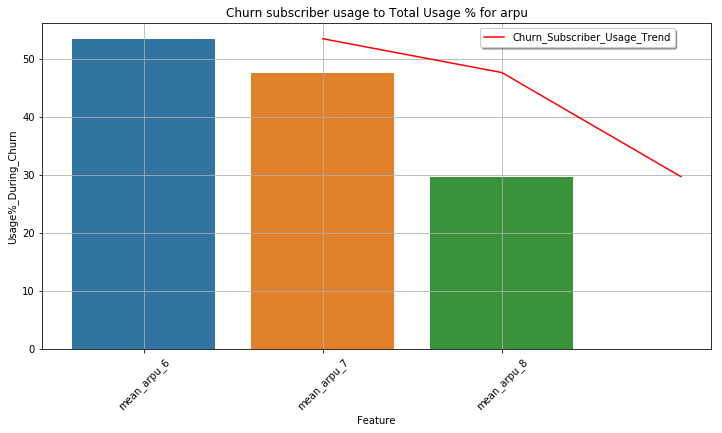

            Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_onnet_mou_6  285.228165  399.419889                58.34
2  mean_onnet_mou_7  303.911379  310.970893                50.57
3  mean_onnet_mou_8  283.675175  119.091218                29.57


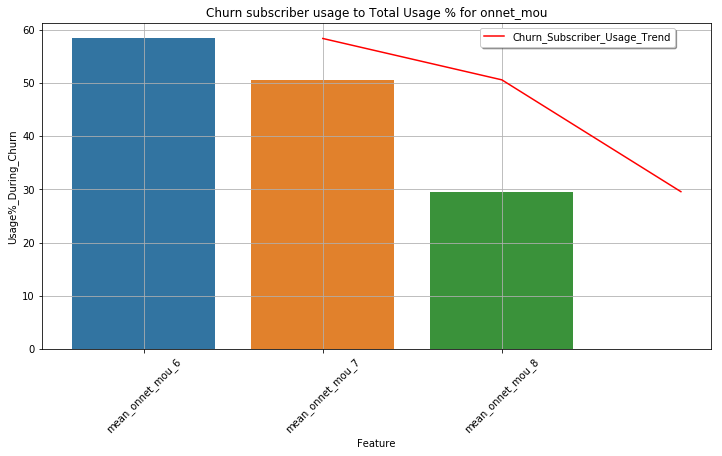

             Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_offnet_mou_6  409.124991  502.513744                55.12
2  mean_offnet_mou_7  426.049209  405.865118                48.79
3  mean_offnet_mou_8  399.125164  150.525215                27.39


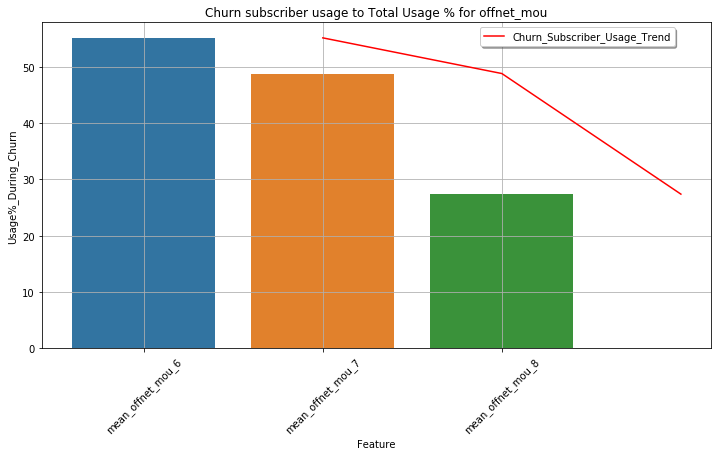

              Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_roam_ic_mou_6  16.236956  28.592834                63.78
2  mean_roam_ic_mou_7  11.936211  28.523813                70.50
3  mean_roam_ic_mou_8  11.918812  25.863318                68.45


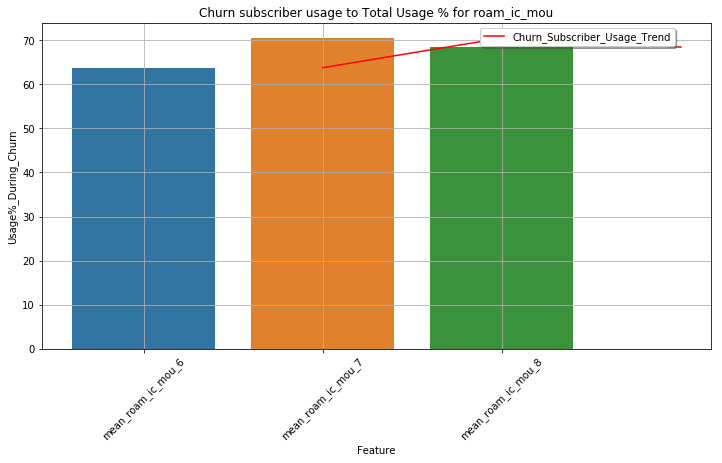

              Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_roam_og_mou_6  26.969581  51.645522                65.69
2  mean_roam_og_mou_7  19.245387  48.405287                71.55
3  mean_roam_og_mou_8  19.164140  43.224118                69.28


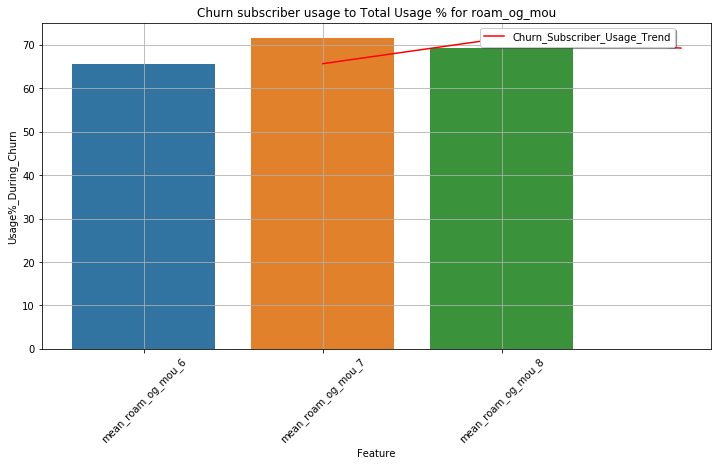

                 Feature   Not-Churn      Churn  Usage%_During_Churn
1  mean_loc_og_t2t_mou_6   97.748689  66.471699                40.48
2  mean_loc_og_t2t_mou_7  100.858115  48.257990                32.36
3  mean_loc_og_t2t_mou_8   94.592089  17.751176                15.80


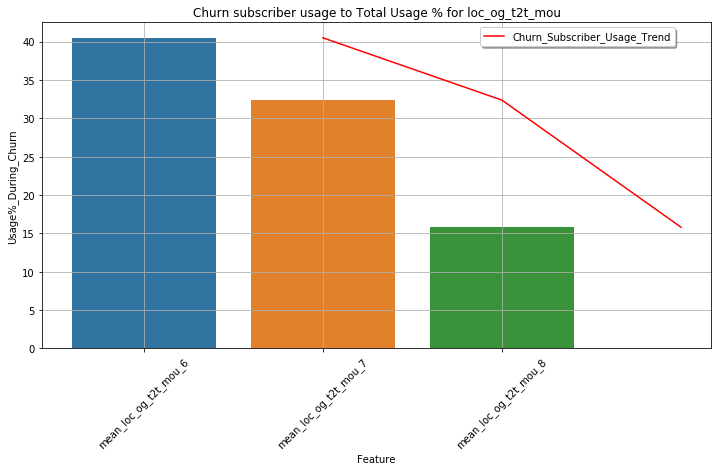

                 Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_loc_og_t2m_mou_6  187.394050  124.559536                39.93
2  mean_loc_og_t2m_mou_7  190.213292   97.997076                34.00
3  mean_loc_og_t2m_mou_8  181.526483   37.235824                17.02


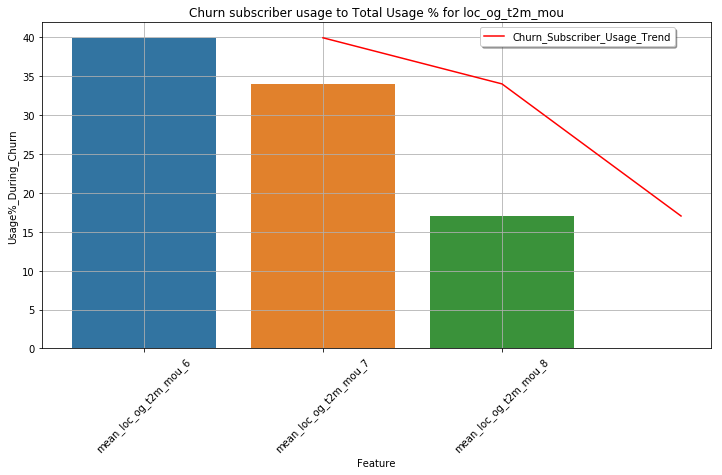

                 Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_loc_og_t2f_mou_6   7.335599  3.638529                33.16
2  mean_loc_og_t2f_mou_7   7.519491  3.169488                29.65
3  mean_loc_og_t2f_mou_8   7.035869  1.436529                16.96


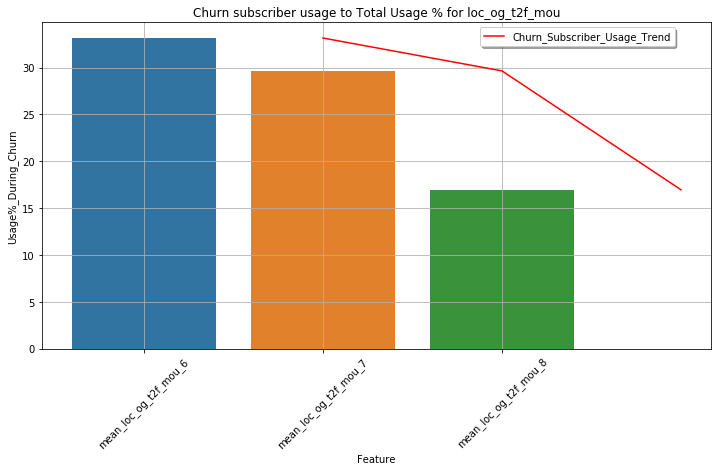

                 Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_loc_og_t2c_mou_6   1.552624  1.709260                52.40
2  mean_loc_og_t2c_mou_7   1.844642  2.043270                52.55
3  mean_loc_og_t2c_mou_8   1.798919  0.918561                33.80


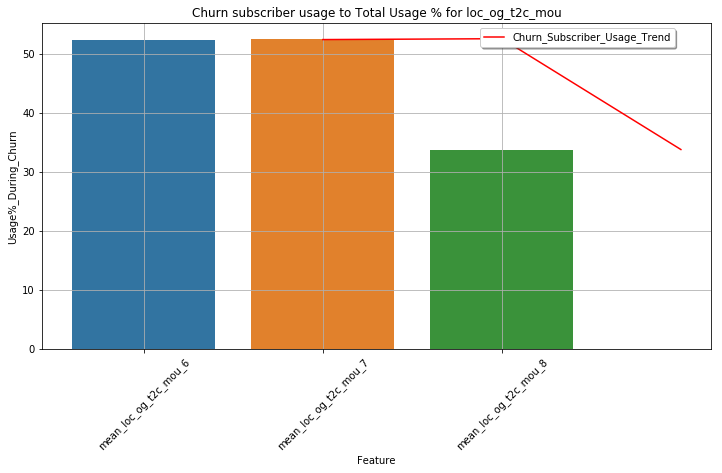

             Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_loc_og_mou_6  292.487316  194.676952                39.96
2  mean_loc_og_mou_7  298.600130  149.431073                33.35
3  mean_loc_og_mou_8  283.163427   56.426740                16.62


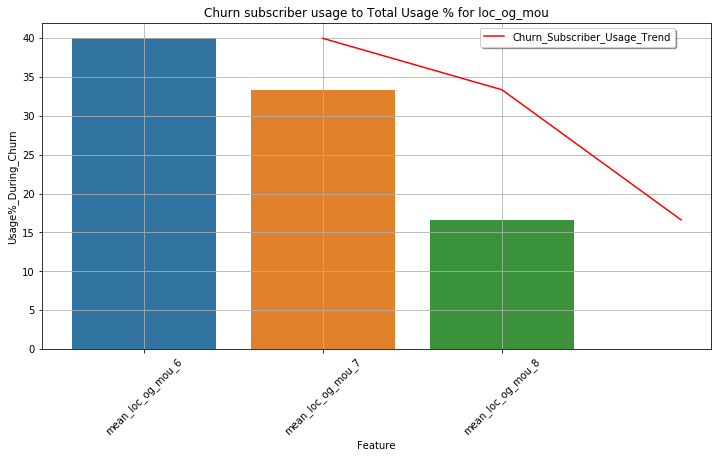

                 Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_std_og_t2t_mou_6  176.910942  311.568457                63.78
2  mean_std_og_t2t_mou_7  195.477452  243.022827                55.42
3  mean_std_og_t2t_mou_8  181.839590   83.454979                31.46


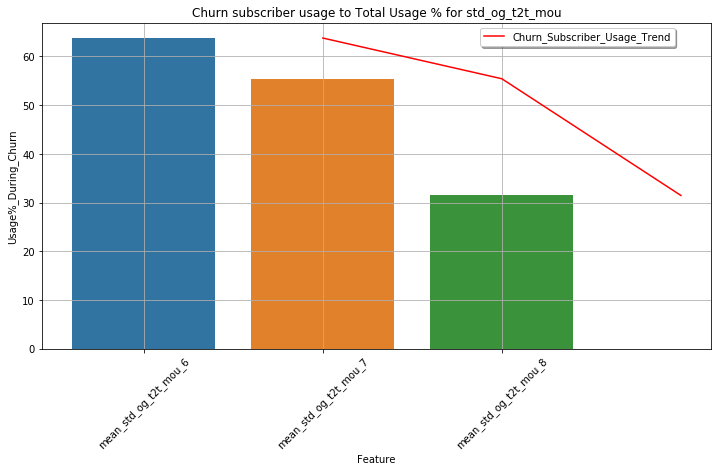

                 Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_std_og_t2m_mou_6  189.257808  334.005090                63.83
2  mean_std_og_t2m_mou_7  207.699928  268.039716                56.34
3  mean_std_og_t2m_mou_8  189.920509   83.539263                30.55


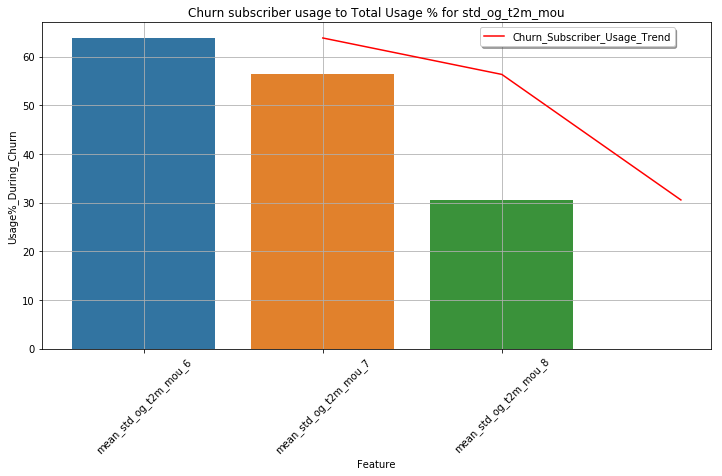

                 Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_std_og_t2f_mou_6   2.102660  1.162920                35.61
2  mean_std_og_t2f_mou_7   2.141403  1.046913                32.84
3  mean_std_og_t2f_mou_8   1.941105  0.383343                16.49


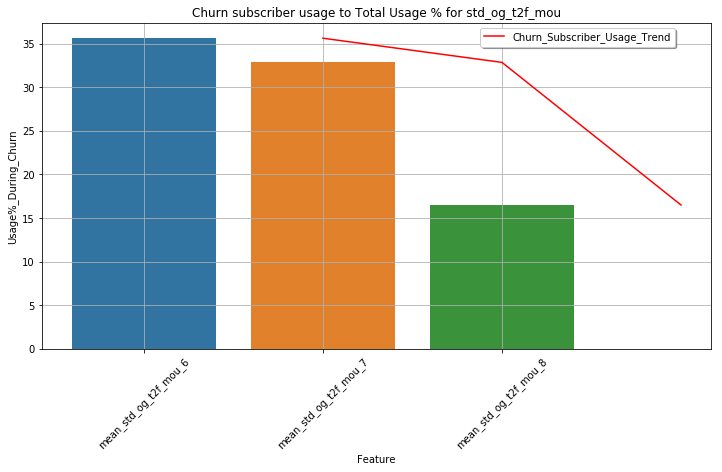

             Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_std_og_mou_6  368.275709  646.741111                63.72
2  mean_std_og_mou_7  405.323110  512.113813                55.82
3  mean_std_og_mou_8  373.705318  167.379481                30.93


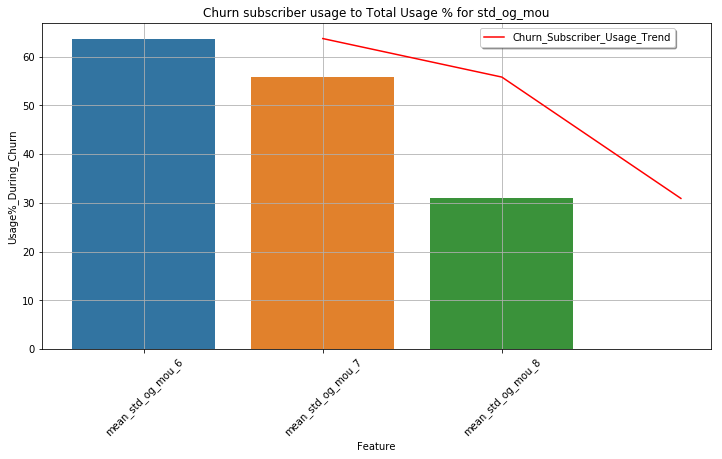

             Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_isd_og_mou_6   2.082636  3.993474                65.72
2  mean_isd_og_mou_7   2.134841  2.891938                57.53
3  mean_isd_og_mou_8   2.127265  1.114931                34.39


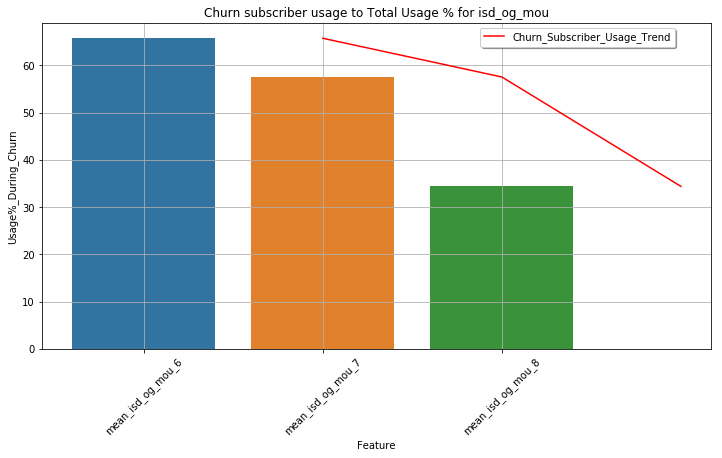

             Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_spl_og_mou_6   5.795734  7.092318                55.03
2  mean_spl_og_mou_7   7.388914  7.813270                51.40
3  mean_spl_og_mou_8   7.299632  3.043858                29.43


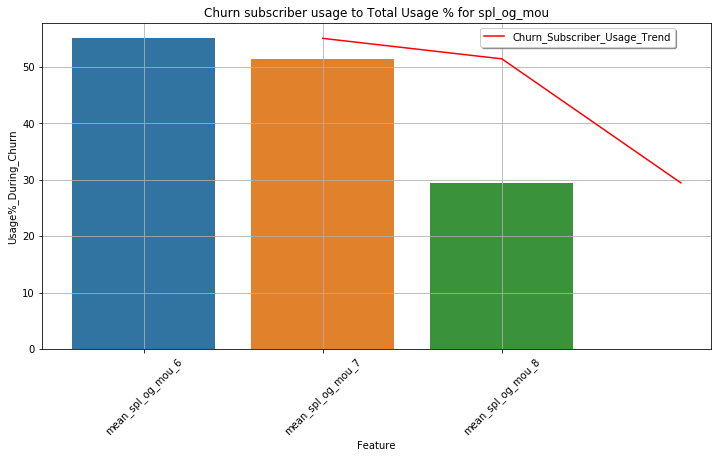

            Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_og_others_6   0.673006  0.882481                56.73
2  mean_og_others_7   0.037492  0.142875                79.21
3  mean_og_others_8   0.052457  0.122346                69.99


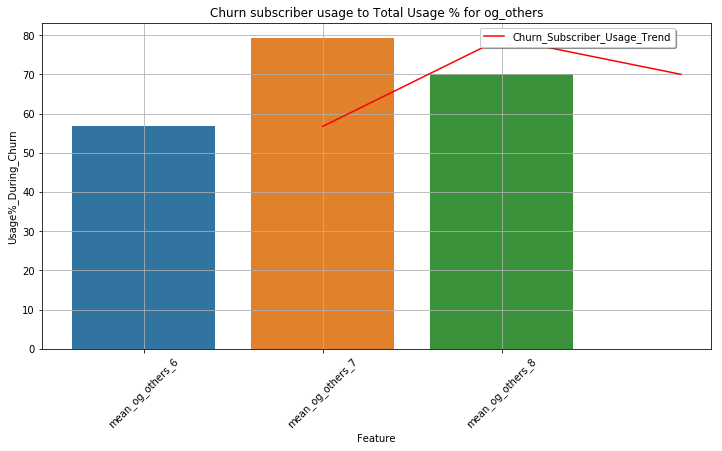

               Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_total_og_mou_6  669.324184  853.396702                56.04
2  mean_total_og_mou_7  713.493307  672.401204                48.52
3  mean_total_og_mou_8  666.356815  228.091595                25.50


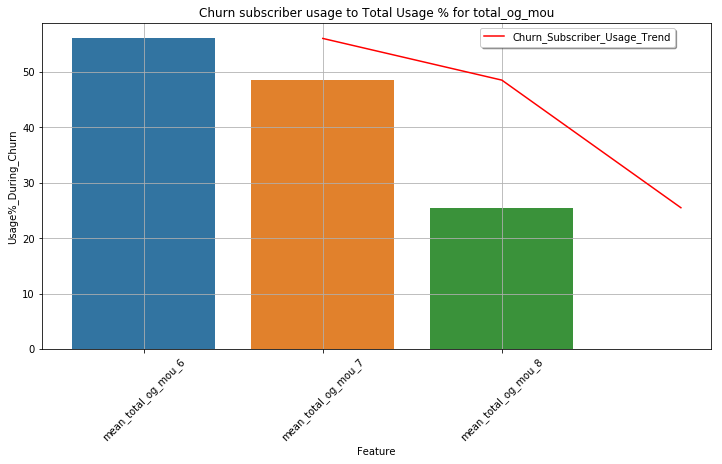

                 Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_loc_ic_t2t_mou_6  70.943867  48.411329                40.56
2  mean_loc_ic_t2t_mou_7  73.696129  38.767059                34.47
3  mean_loc_ic_t2t_mou_8  71.453281  14.459471                16.83


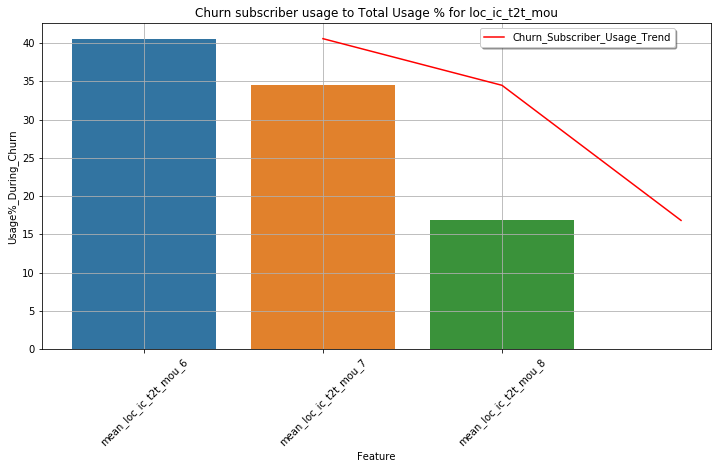

                 Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_loc_ic_t2m_mou_6  164.383205  115.581446                41.28
2  mean_loc_ic_t2m_mou_7  168.288822   91.184536                35.14
3  mean_loc_ic_t2m_mou_8  166.320172   34.882526                17.34


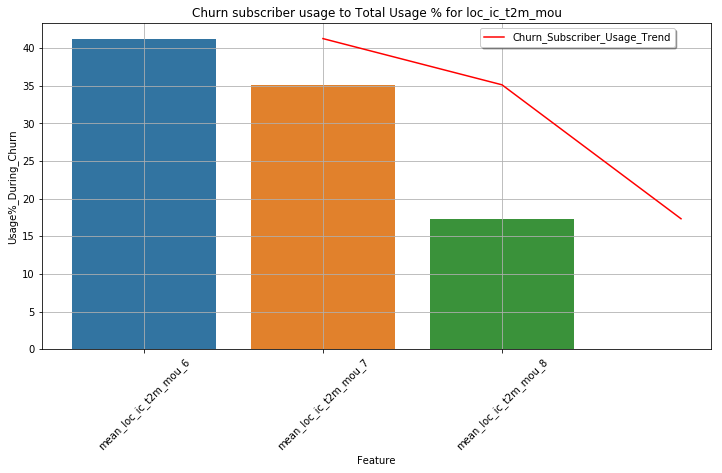

                 Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_loc_ic_t2f_mou_6  16.423168  7.932048                32.57
2  mean_loc_ic_t2f_mou_7  17.478314  7.526163                30.10
3  mean_loc_ic_t2f_mou_8  15.965126  2.975696                15.71


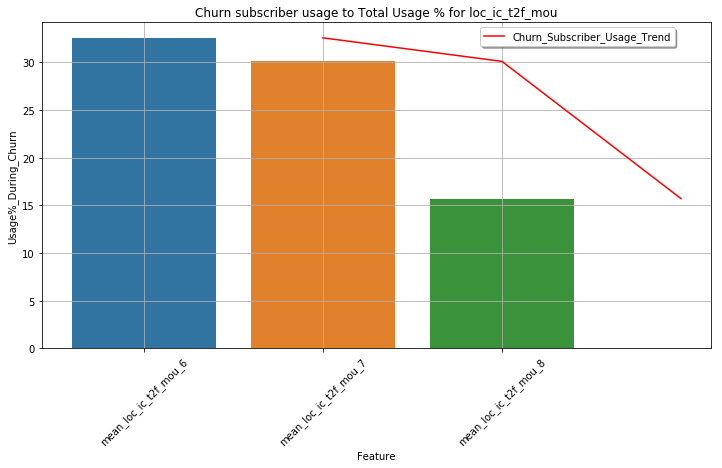

             Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_loc_ic_mou_6  251.760287  171.932803                40.58
2  mean_loc_ic_mou_7  259.473565  137.484934                34.63
3  mean_loc_ic_mou_8  253.748761   52.321651                17.09


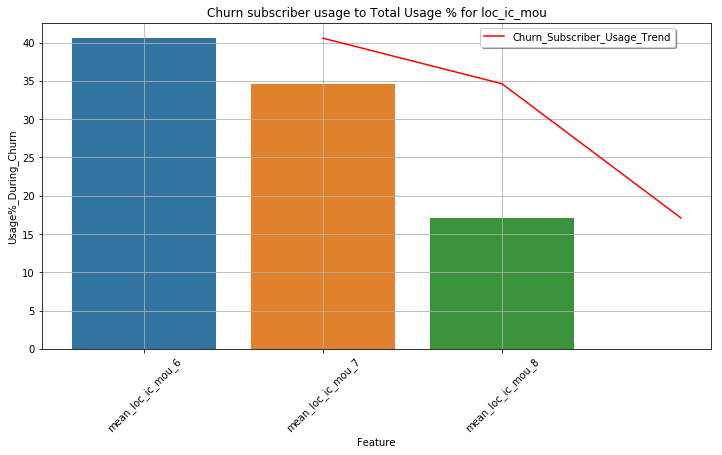

                 Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_std_ic_t2t_mou_6  15.739238  20.916301                57.06
2  mean_std_ic_t2t_mou_7  17.005585  15.972986                48.43
3  mean_std_ic_t2t_mou_8  16.130609   5.038893                23.80


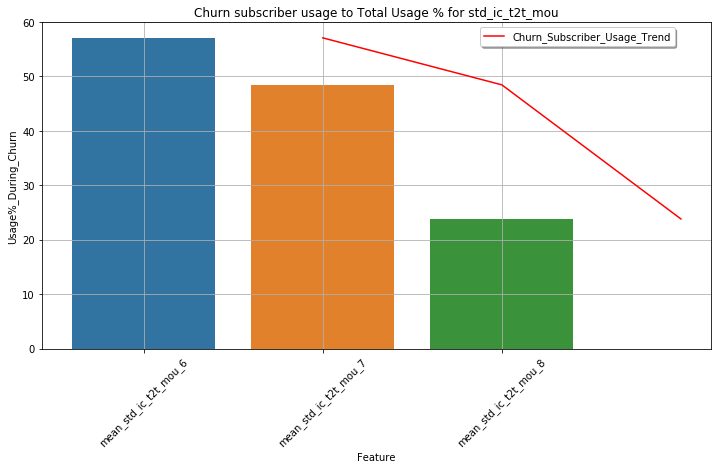

                 Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_std_ic_t2m_mou_6  31.742812  34.725886                52.24
2  mean_std_ic_t2m_mou_7  34.088722  27.870927                44.98
3  mean_std_ic_t2m_mou_8  32.549258  10.594920                24.56


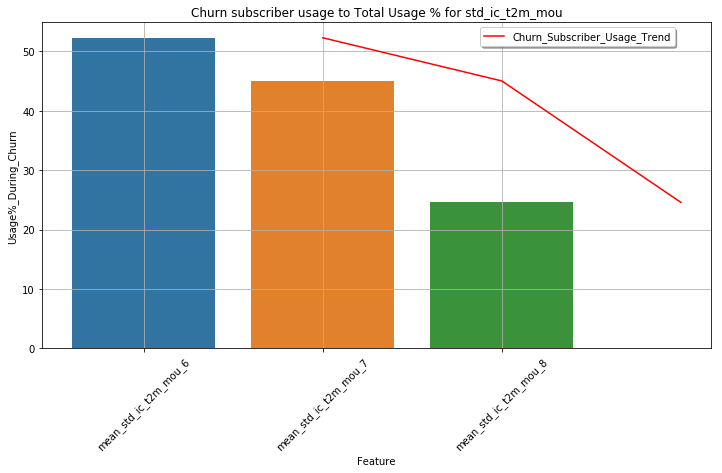

                 Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_std_ic_t2f_mou_6   3.021584  1.520927                33.48
2  mean_std_ic_t2f_mou_7   3.131814  1.715869                35.40
3  mean_std_ic_t2f_mou_8   2.910733  0.548927                15.87


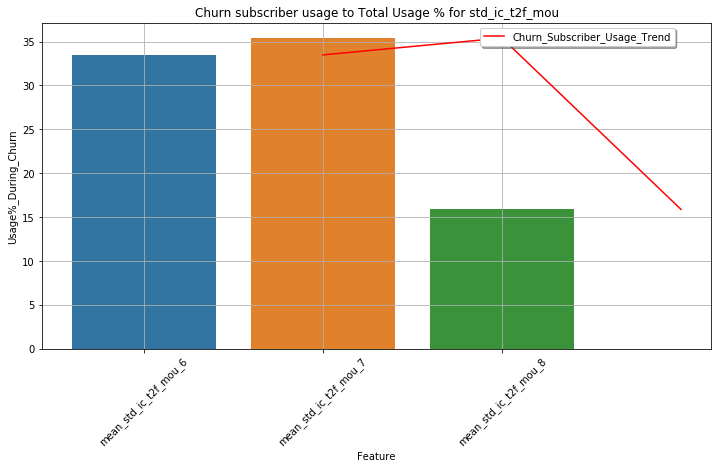

             Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_std_ic_mou_6  50.507598  57.167194                53.09
2  mean_std_ic_mou_7  54.230225  45.563246                45.66
3  mean_std_ic_mou_8  51.594579  16.184270                23.88


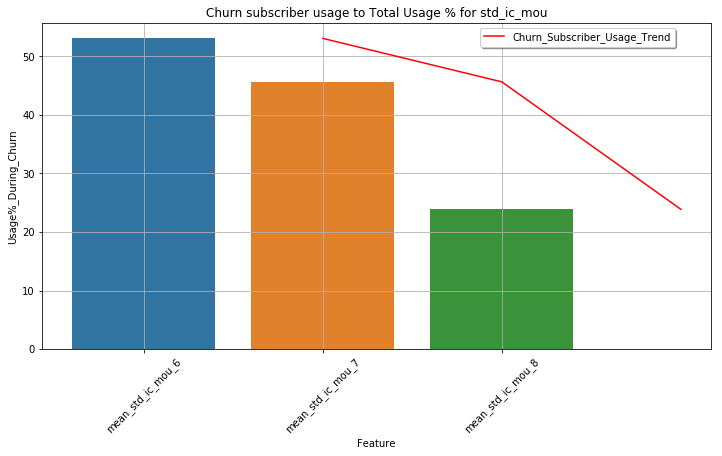

               Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_total_ic_mou_6  314.654045  241.728993                43.45
2  mean_total_ic_mou_7  327.823473  194.325152                37.22
3  mean_total_ic_mou_8  319.203952   73.032190                18.62


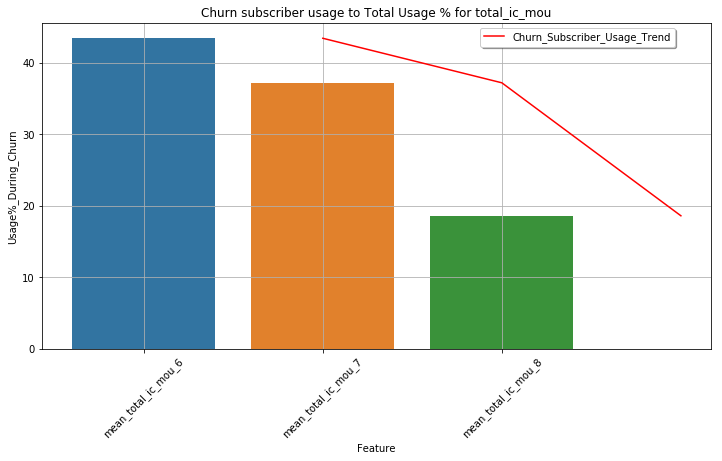

             Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_spl_ic_mou_6   0.067053  0.063768                48.74
2  mean_spl_ic_mou_7   0.018383  0.015069                45.05
3  mean_spl_ic_mou_8   0.029726  0.007765                20.71


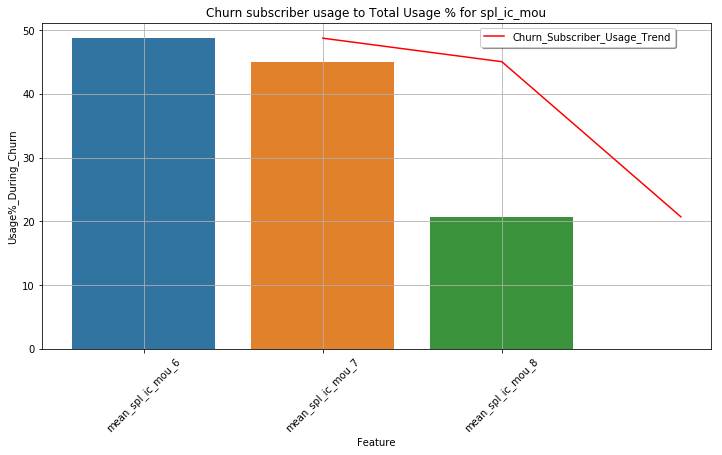

             Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_isd_ic_mou_6  11.101744  11.543709                50.98
2  mean_isd_ic_mou_7  12.538083  10.497308                45.57
3  mean_isd_ic_mou_8  12.491847   4.154374                24.96


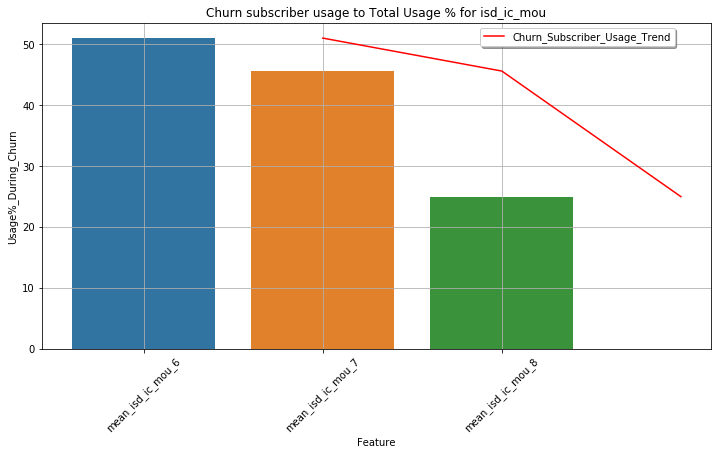

            Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_ic_others_6   1.208649  1.013159                45.60
2  mean_ic_others_7   1.555012  0.757813                32.77
3  mean_ic_others_8   1.330881  0.360612                21.32


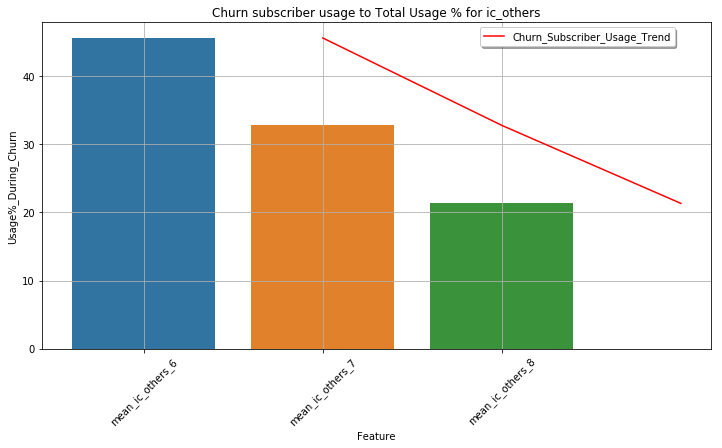

                 Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_total_rech_num_6  11.898040  14.234256                54.47
2  mean_total_rech_num_7  11.951198  11.567474                49.18
3  mean_total_rech_num_8  10.731884   5.485121                33.82


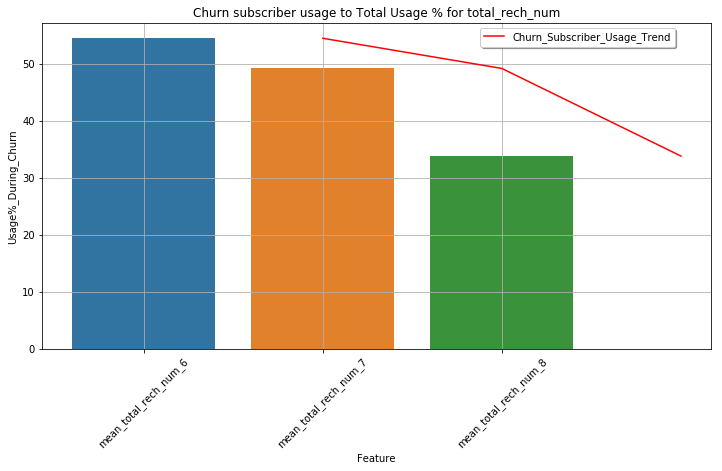

                 Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_total_rech_amt_6  687.484329  793.664706                53.58
2  mean_total_rech_amt_7  703.582450  628.133218                47.17
3  mean_total_rech_amt_8  652.272066  254.312111                28.05


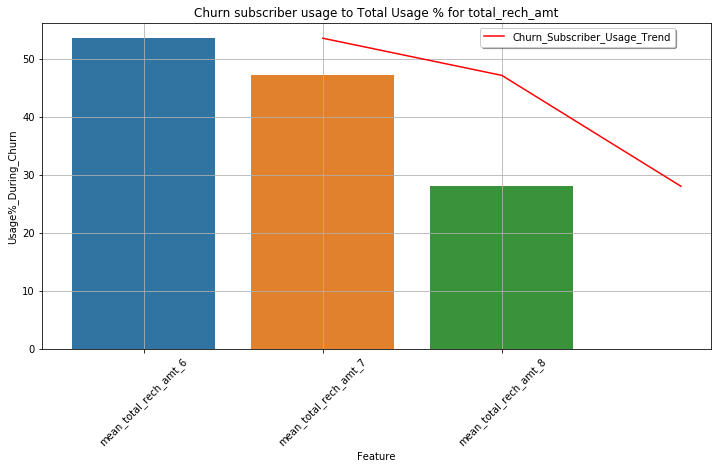

               Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_max_rech_amt_6  171.901805  167.434256                49.34
2  mean_max_rech_amt_7  177.776736  156.472664                46.81
3  mean_max_rech_amt_8  171.226439   85.157785                33.21


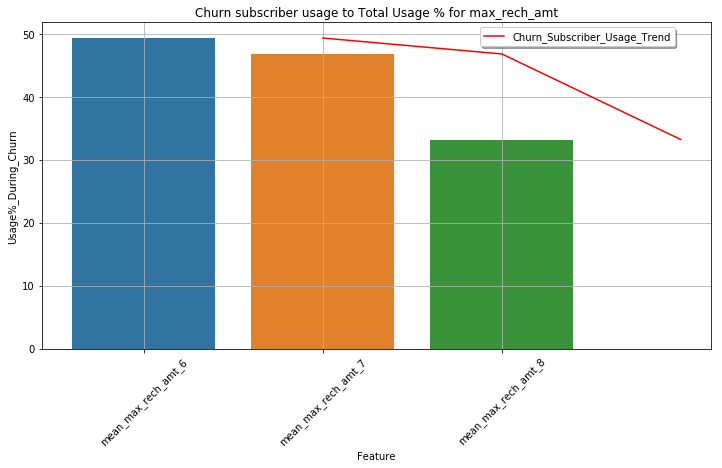

                   Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_last_day_rch_amt_6  104.686109  103.366090                49.68
2  mean_last_day_rch_amt_7  107.917679   80.798616                42.81
3  mean_last_day_rch_amt_8  102.025619   36.177163                26.18


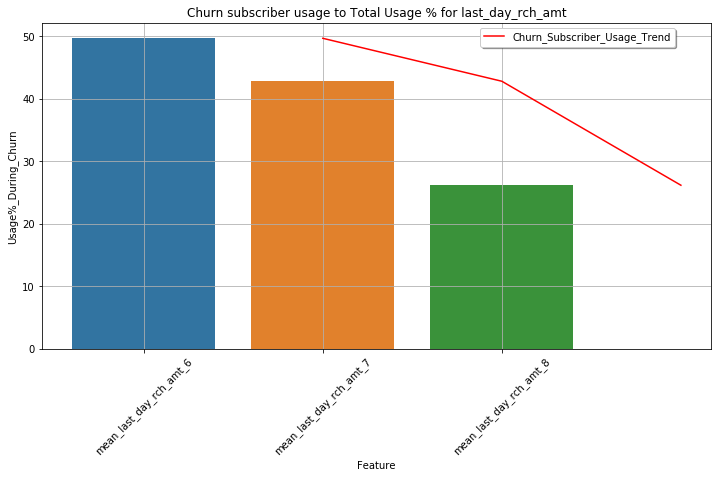

            Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_vol_2g_mb_6  80.646890  62.269166                43.57
2  mean_vol_2g_mb_7  81.141277  50.597211                38.41
3  mean_vol_2g_mb_8  74.913443  16.151678                17.74


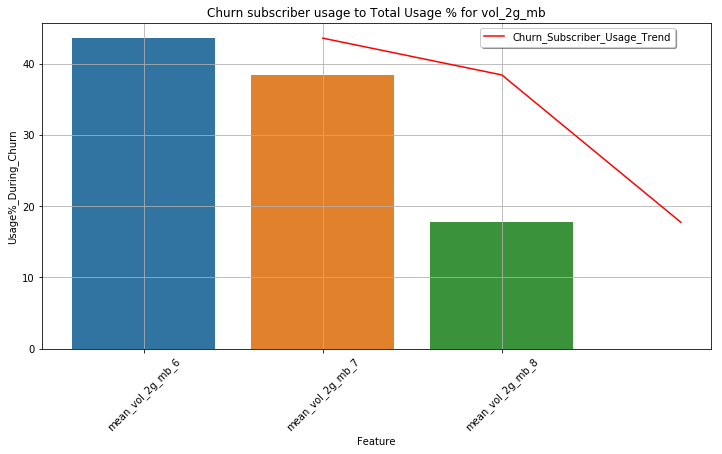

            Feature   Not-Churn       Churn  Usage%_During_Churn
1  mean_vol_3g_mb_6  266.155294  188.023197                41.40
2  mean_vol_3g_mb_7  290.785851  161.694100                35.74
3  mean_vol_3g_mb_8  292.427606   60.412035                17.12


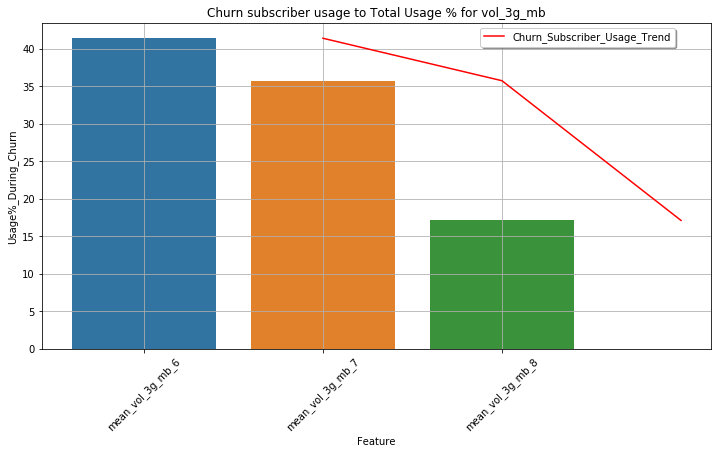

             Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_monthly_2g_6   0.131529  0.063322                32.50
2  mean_monthly_2g_7   0.139725  0.053633                27.74
3  mean_monthly_2g_8   0.124331  0.017993                12.64


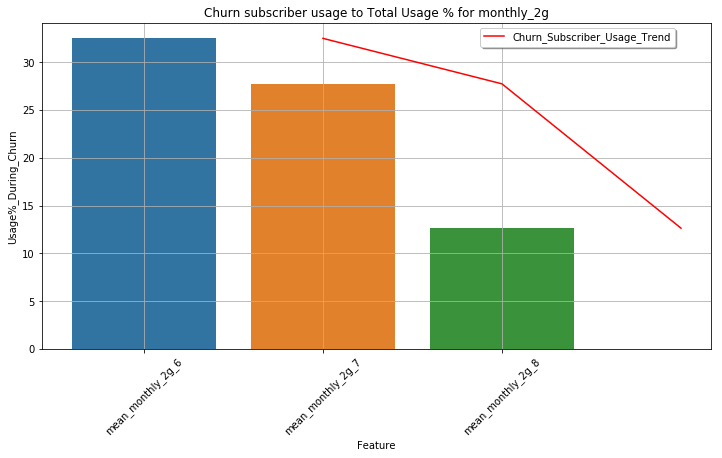

            Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_sachet_2g_6   0.507106  0.431488                45.97
2  mean_sachet_2g_7   0.604784  0.419031                40.93
3  mean_sachet_2g_8   0.651445  0.195848                23.11


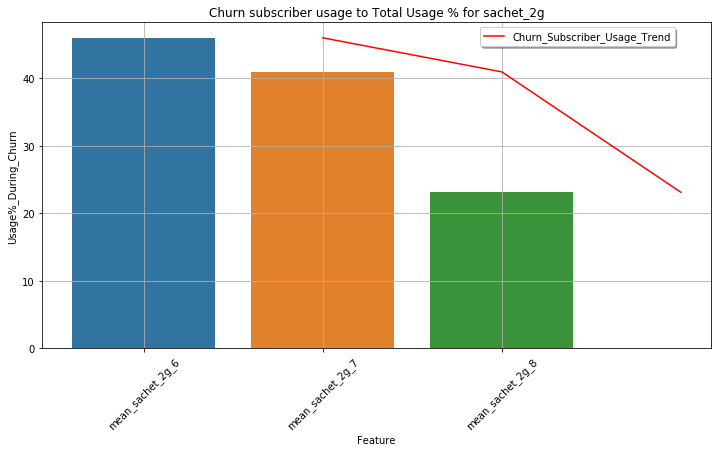

             Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_monthly_3g_6   0.178375  0.133564                42.82
2  mean_monthly_3g_7   0.194322  0.100692                34.13
3  mean_monthly_3g_8   0.188268  0.033218                15.00


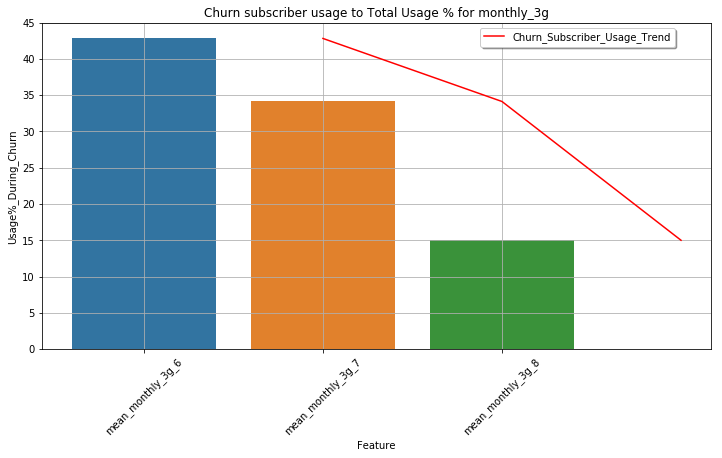

            Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_sachet_3g_6   0.139319  0.126298                47.55
2  mean_sachet_3g_7   0.151464  0.139792                48.00
3  mean_sachet_3g_8   0.150873  0.043253                22.28


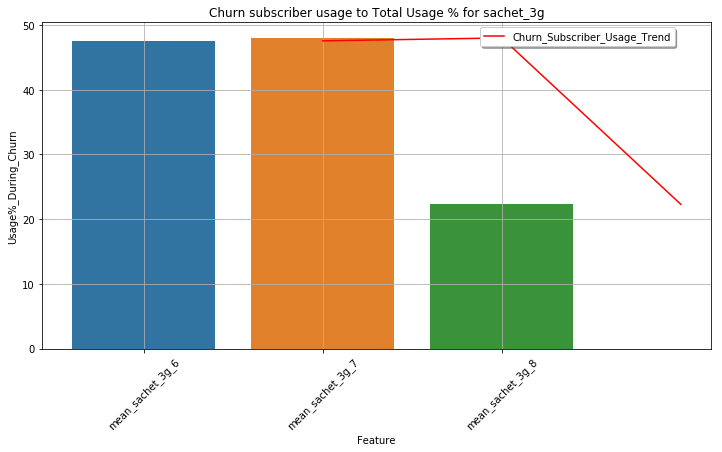

           Feature   Not-Churn      Churn  Usage%_During_Churn
1  mean_jun_vbc_3g  125.518181  83.326945                39.90
2  mean_jul_vbc_3g  141.598752  75.485363                34.77
3  mean_aug_vbc_3g  139.625424  34.408595                19.77


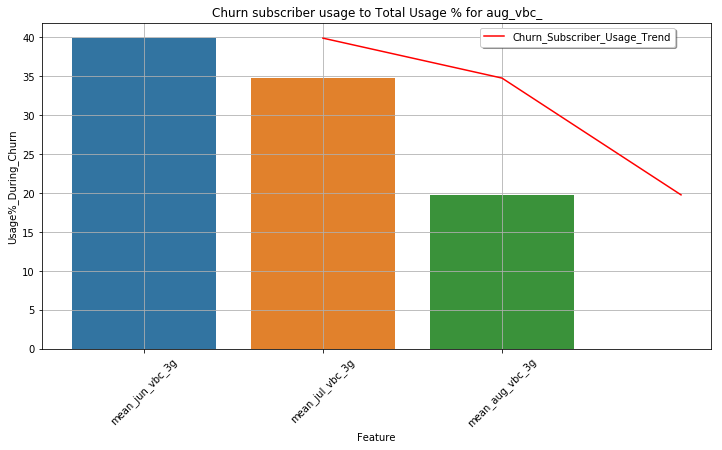

                     Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_loc_og_mou_Percent_6  52.708560  29.613170                35.97
2  mean_loc_og_mou_Percent_7  53.249801  28.960253                35.23
3  mean_loc_og_mou_Percent_8  53.475177  19.059464                26.28


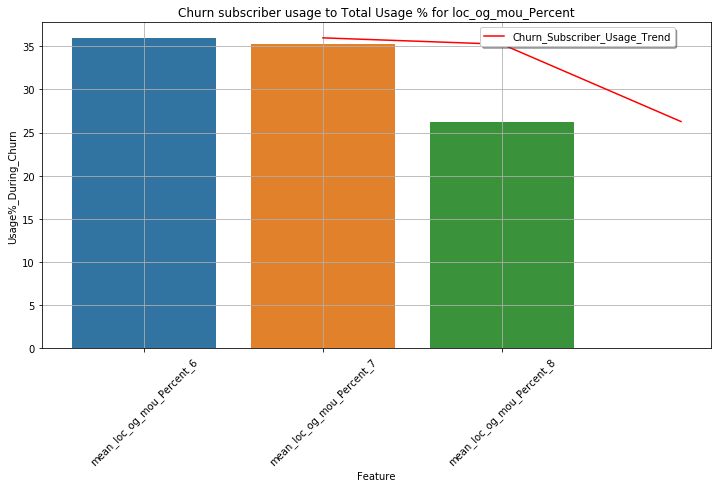

                     Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_std_og_mou_Percent_6  41.938430  58.297256                58.16
2  mean_std_og_mou_Percent_7  42.079739  54.036623                56.22
3  mean_std_og_mou_Percent_8  40.548743  29.220855                41.88


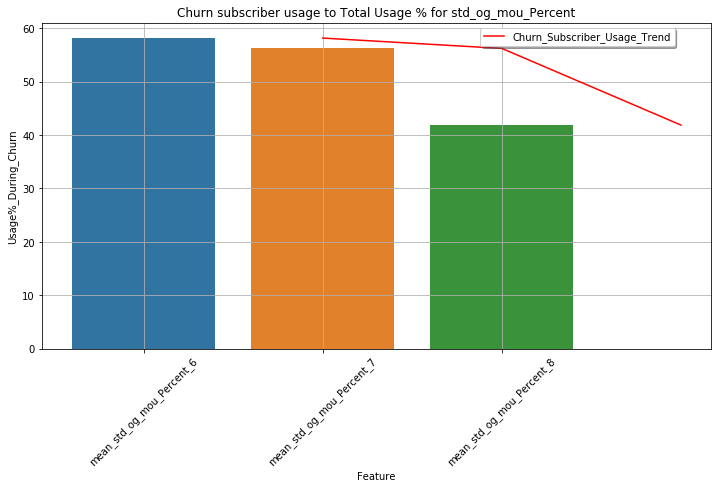

                     Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_spl_og_mou_Percent_6   1.622290  1.652467                50.46
2  mean_spl_og_mou_Percent_7   1.935318  2.139343                52.50
3  mean_spl_og_mou_Percent_8   2.364349  2.698097                53.30


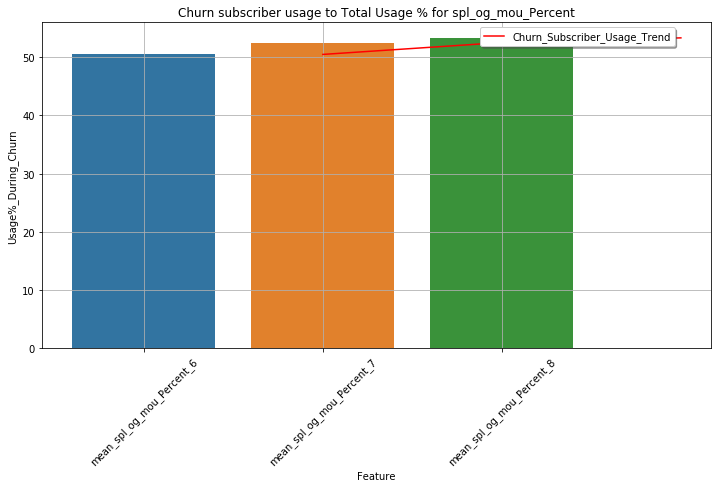

                    Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_og_others_Percent_6   0.177869  0.192052                51.92
2  mean_og_others_Percent_7   0.010068  0.009436                48.38
3  mean_og_others_Percent_8   0.015109  0.017152                53.17


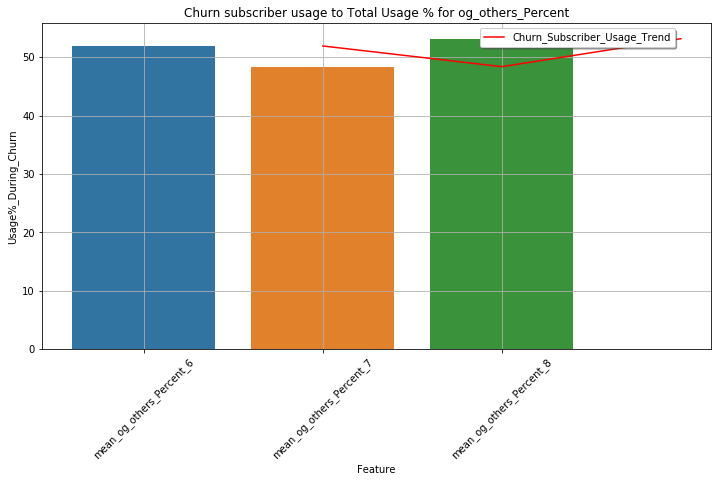

                     Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_loc_ic_mou_Percent_6  76.232645  63.287346                45.36
2  mean_loc_ic_mou_Percent_7  76.859255  60.519478                44.05
3  mean_loc_ic_mou_Percent_8  76.527610  37.483069                32.88


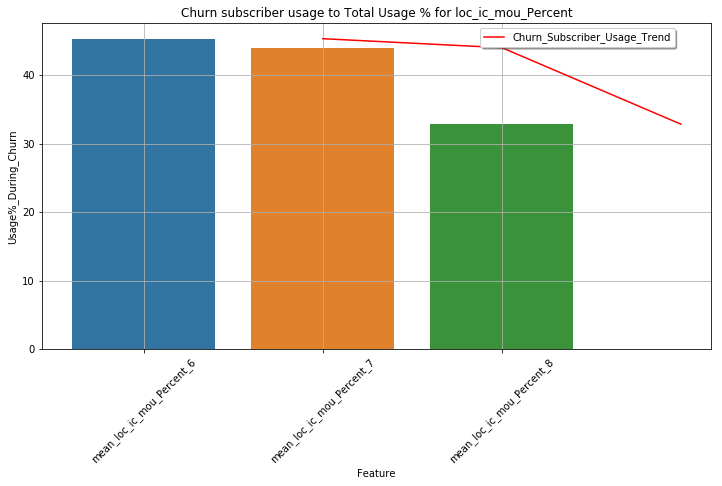

                     Feature  Not-Churn      Churn  Usage%_During_Churn
1  mean_std_ic_mou_Percent_6  17.794217  23.234218                56.63
2  mean_std_ic_mou_Percent_7  17.870203  21.189734                54.25
3  mean_std_ic_mou_Percent_8  17.391641  12.327917                41.48


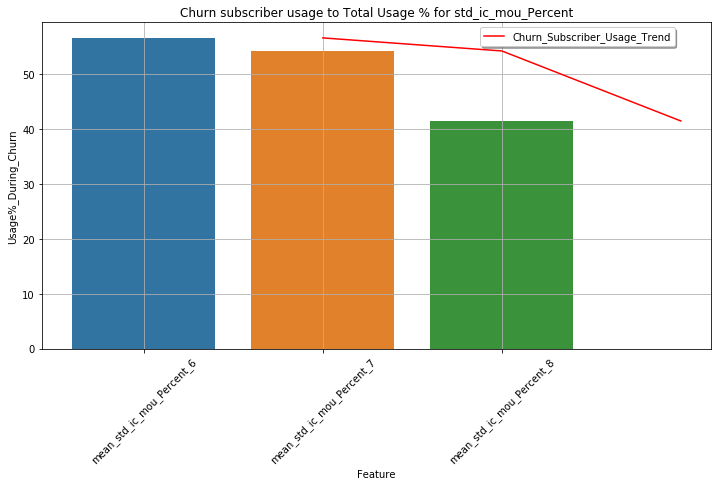

                     Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_spl_ic_mou_Percent_6   0.074751  0.103464                58.06
2  mean_spl_ic_mou_Percent_7   0.026636  0.087253                76.61
3  mean_spl_ic_mou_Percent_8   0.042982  0.061021                58.67


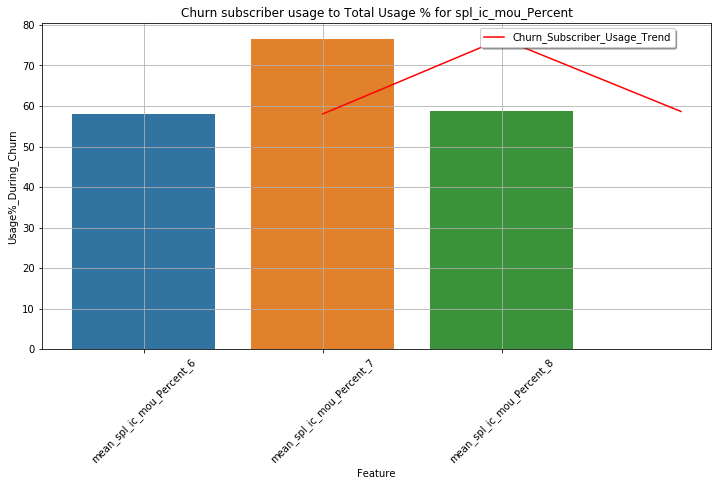

                    Feature  Not-Churn     Churn  Usage%_During_Churn
1  mean_ic_others_Percent_6   0.421887  0.419747                49.87
2  mean_ic_others_Percent_7   0.489235  0.506163                50.85
3  mean_ic_others_Percent_8   0.451854  0.256533                36.21


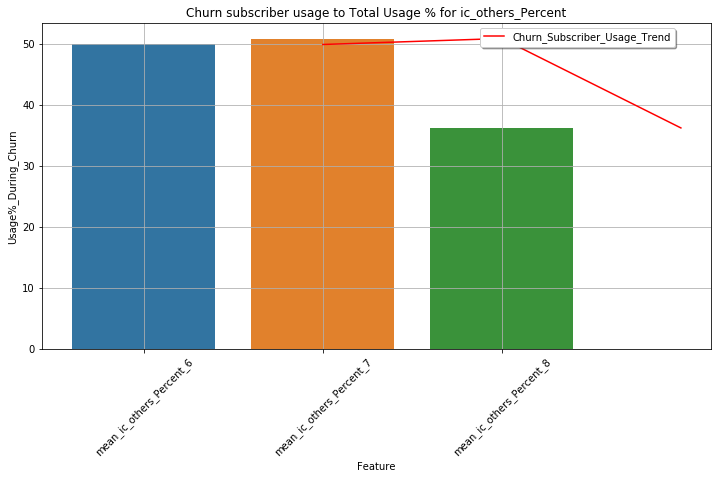

In [ ]:
percentageChurnSubscriber()

EDA Insights


By Considering august Month as Churn Decision month and june and july as Good Month, following are the insight for all the features
Average Revenue per user (ARPU) is less in august month than june and july month.
Onnet-Monthly-Usage (Onnet_MOU) is less in august Month than june and july Month.
Offnet-Montly-Usage (Offnet_MOU) is less in august Month than june and july Month.
ROAM_Incoming_MontlyUsage (Roam_IC_MOU) is not having any changes in good and decision period.
Roam_Outgoing_MonthlyUsage (Roam_OG_MOU) is not having any changes in good and decision perod.
Local Outgoing t2t Monthly Usage is less in august Month than june and july Month.
Local Outgoing t2m Monthly Usage is less in august month than june and july month.
Local Outgoing t2f Monthly Usage is less in august month than june and july month.
Local Outgoing t2c Monthly Usage is less in august month than june and july month.
Local Outgoing Monthly Usage is less in august month than june and july month.
STD outgoing t2t Monthly Usage is less in august month than june and july month.
STD outgoing t2m Monthly usage is less in august month than june and july month.
STD Outgoinh t2f Monthly Usage is less in august month than june and july month.
STD outgoing Monthly Usage is less in august month than june and july month.
ISD Outgoing Monthly Usage is less in august month than june and july month.
Special Outgoing Monthly Usage is less in august month than june and july month.
Outgoing Others is not having any changes in good and decision period.
Total Outgoing Monthly Usage is less in august Month than june and july month.
Local Incoming t2t Monthly Usage is less in august month than june and july month.
Local incoming t2m Monthly Usage is less in august month than june and july month.
Local incoming t2f Monthly Usage is less in august month than june and july month.
Local incoming usage Monthly Usage is less in august month than june and july month.
STD incoming t2t Monthly Usage is less in august month than june and july month.
STD incoming t2m monthly usage is less in august month than june and july month.
STD incoming t2f monthly usage is less in august month than june and july month.
STD incoming monthly usage is less in august month than june and july month.
Total Incoming Monthly Usage is less in august month than june and july month.
spl_ic_mou is less in august month than june and july month.
isd_ic_mou is less in august month than june and july month.
ic_others is less in august month than june and july month.
total_rech_num is less in august month than june and july month.
toal_rech_amt is less in august month than june and july month.
max_rech_amt is less in august month than june and july month.
last_rech_amt is less in august month than june and july month.
vol_2g_mb is less in august month than june and july month.
vol_3g_mb is less in august month than june and july month.
monthly_2g is less in august month than june and july month.
sachet_2g is less in august month than june and july month.
monhtly_3g is less in august month than june and july month.
sachet_3g is less in august month than june and july month.
vbc_3g is less in august month than june and july month.

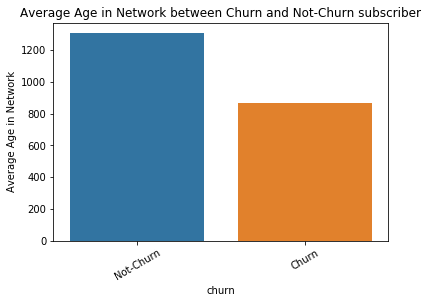

In [ ]:
# AON feature trend in all the June,july,august months for churn and non-churn subscribers

X1 = churn_data.groupby('churn')['aon'].agg(['mean']).reset_index()
p = sns.barplot(x='churn', y='mean', data=X1)
p.set_xticklabels(['Not-Churn', 'Churn'],rotation=30)
p.set_ylabel('Average Age in Network')
plt.title('Average Age in Network between Churn and Not-Churn subscriber')
plt.show()

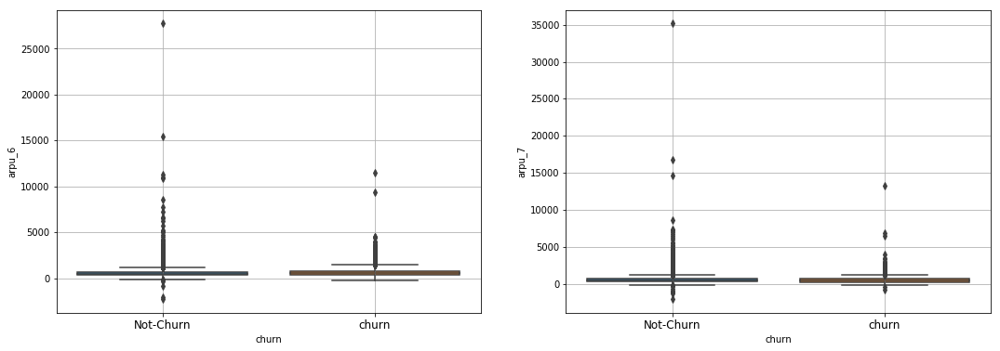

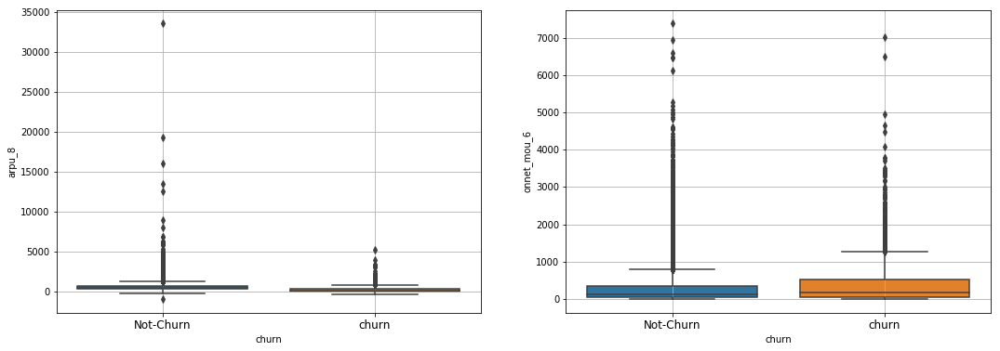

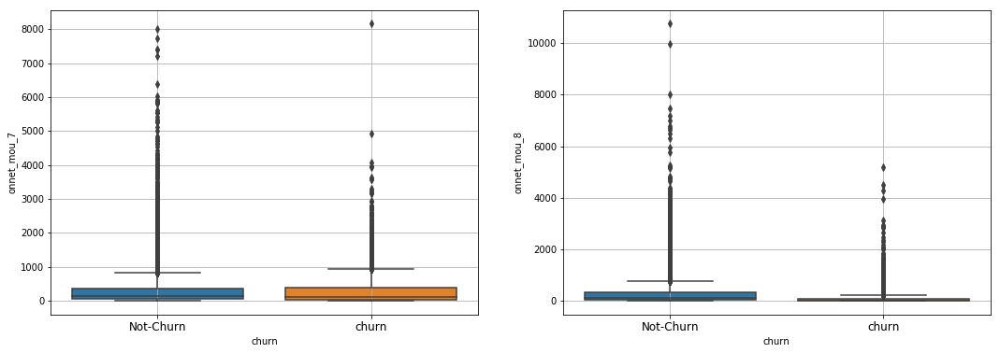

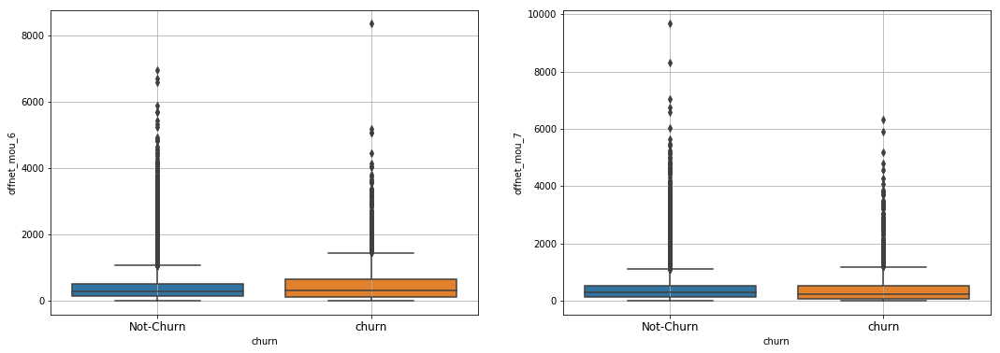

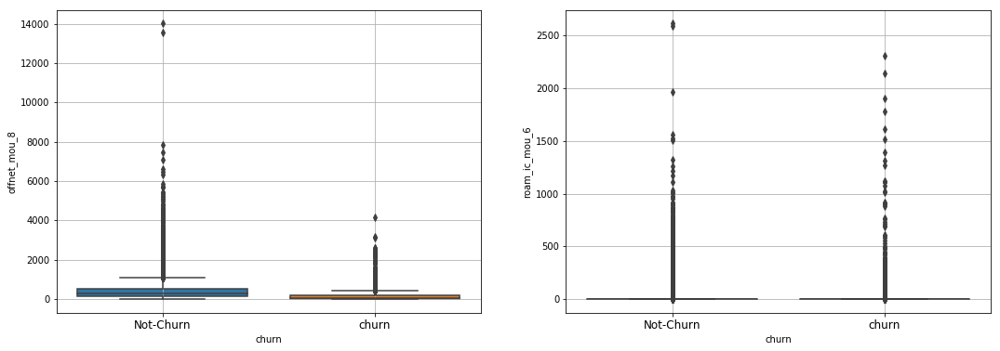

...

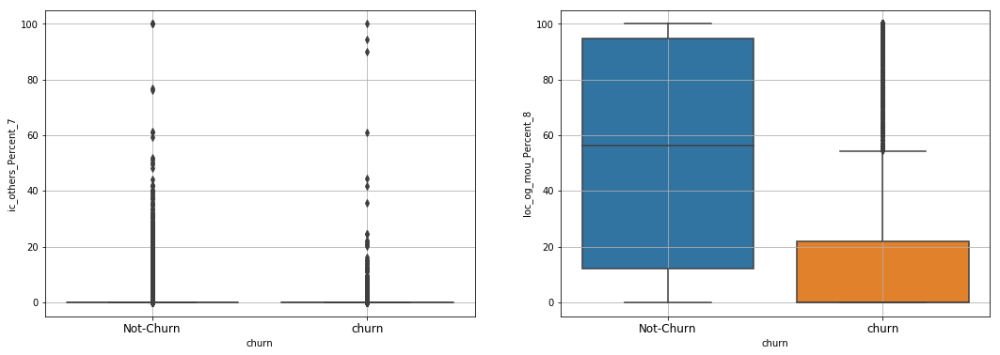

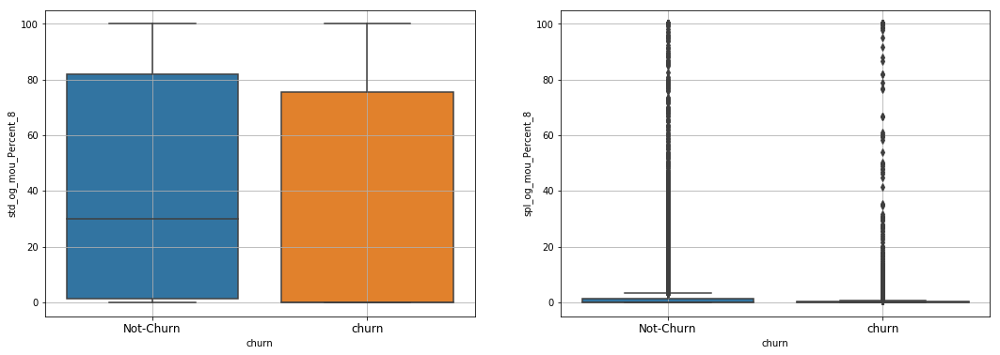

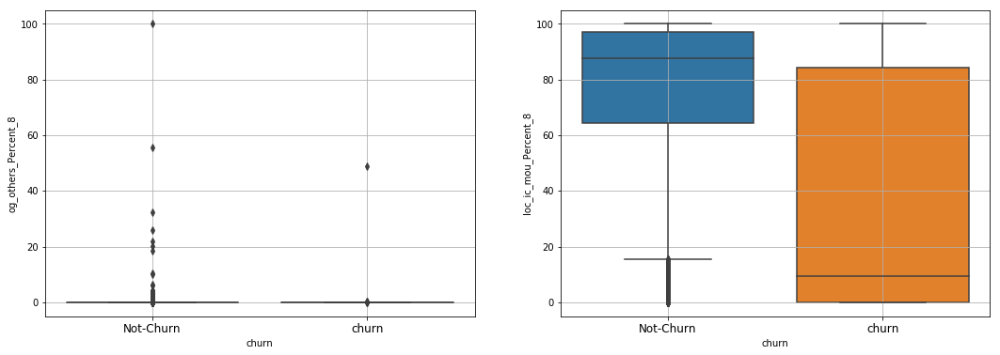

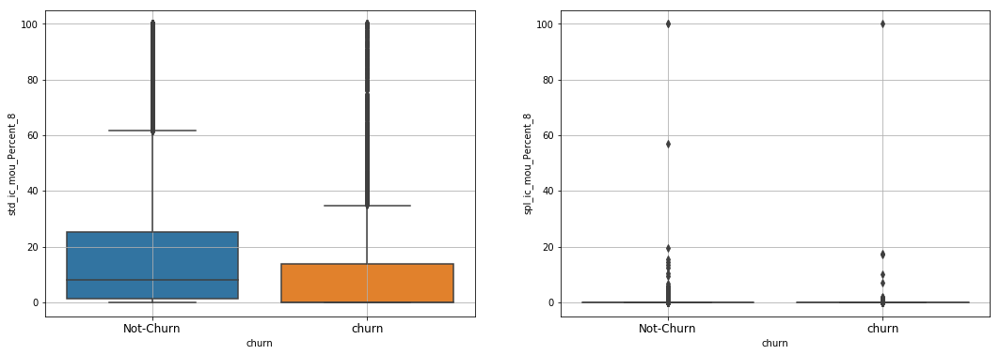

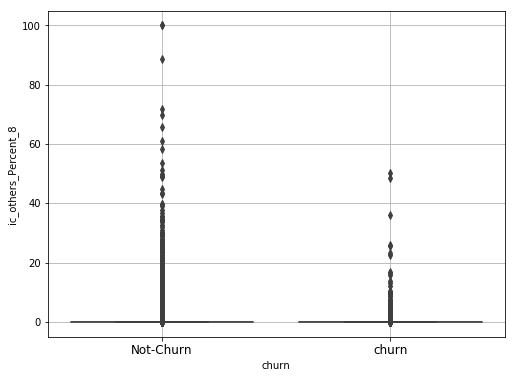

In [ ]:
# Checking the outliners
featurewiseOutlierBetweenChurnAndNonChurn()

Insights for outliners and necessary actions
Drop Record with arpu_6 more than 15000
Drop arpu_7 more than 20000
Drop arpu_8 more than 20000
onnet_mou_8 more than 8000
offnet_mou_7 more than 9000
offnet_mou_8 more than 10000
loc_og_t2t_mou_6 more tan 6000
loc_og_t2t_mou_7 more than 5000
loc_og_t2t_mou_8 more than 6000
loc_og_t2m_mou_6 more than 4000
loc_og_t2f_mou_7 more than 600
loc_og_t2f_mou_8 more than 600
loc_og_t2c_mou_8 more than 250
loc_og_mou_6 more than 8000
loc_og_mou_7 more than 6000
loc_og_mou_8 more than 6000
std_og_t2m_mou_8 more than 8000
std_og_t2f_mou_6 more than 400
std_og_t2f_mou_7 more than 400
std_og_t2f_mou_8 more than 400
std_og_mou_8 more than 10000
spl_og_mou_7 more than 800
spl_og_mou_8 more than 600
total_og_mou_8 more than 8000
loc_ic_t2m_mou_8 more than 3000
loc_ic_t2f_mou_6 more than 1000
loc_ic_t2f_mou_8 more than 1000
loc_ic_mou_8 more than 4000
std_ic_t2m_mou_8 more than 3000
std_ic_t2f_mou_8 more than 800
std_ic_mou_8 more than 3000
total_ic_mou_8 more than 4000
isd_ic_mou_7 more than 3000
isd_ic_mou_8 more than 2000
ic_others_8 more than 400
sachet_2g_8 more than 30
sachet_3g_8 more than 30

In [ ]:
# Dropping the outliners
churn_data = churn_data.drop(churn_data.loc[(churn_data['churn'] == 0) & (
    (churn_data['arpu_6'] > 15000) | (churn_data['arpu_7'] > 20000) | (churn_data['arpu_8'] > 20000) | (churn_data['onnet_mou_8'] > 8000) | 
    (churn_data['offnet_mou_7'] > 9000) | (churn_data['offnet_mou_8'] > 10000) | (churn_data['loc_og_t2t_mou_6'] > 6000) | (churn_data['loc_og_t2t_mou_7'] > 5000) |
    (churn_data['loc_og_t2t_mou_8'] > 6000) | (churn_data['loc_og_t2m_mou_6'] > 4000) | (churn_data['loc_og_t2f_mou_7'] > 600) | (churn_data['loc_og_t2f_mou_8'] > 600) |
    (churn_data['loc_og_t2c_mou_8'] > 250) | (churn_data['loc_og_mou_6'] > 8000) | (churn_data['loc_og_mou_7'] > 6000) | (churn_data['loc_og_mou_8'] > 6000) |
    (churn_data['std_og_t2m_mou_8'] > 8000) | (churn_data['std_og_t2f_mou_6'] > 400) | (churn_data['std_og_t2f_mou_7'] > 400) | (churn_data['std_og_t2f_mou_8'] > 400) |
    (churn_data['std_og_mou_8'] > 10000) | (churn_data['spl_og_mou_7'] > 800) | (churn_data['spl_og_mou_8'] > 600) |(churn_data['total_og_mou_8'] > 8000) |
    (churn_data['loc_ic_t2m_mou_8'] > 3000) | (churn_data['loc_ic_t2f_mou_6'] > 1000) |(churn_data['loc_ic_t2f_mou_8'] > 1000) |(churn_data['loc_ic_mou_8'] > 4000) |
    (churn_data['std_ic_t2m_mou_8'] > 3000) | (churn_data['std_ic_t2f_mou_8'] > 800) | (churn_data['std_ic_mou_8'] > 3000) | (churn_data['total_ic_mou_8'] > 4000) |
    (churn_data['isd_ic_mou_7'] > 3000) | (churn_data['isd_ic_mou_8'] > 2000) | (churn_data['ic_others_8'] > 400) | (churn_data['sachet_2g_8'] > 30) | (churn_data['sachet_3g_8'] > 30)
)].index)

In [ ]:
churn_data.shape

(29889, 157)

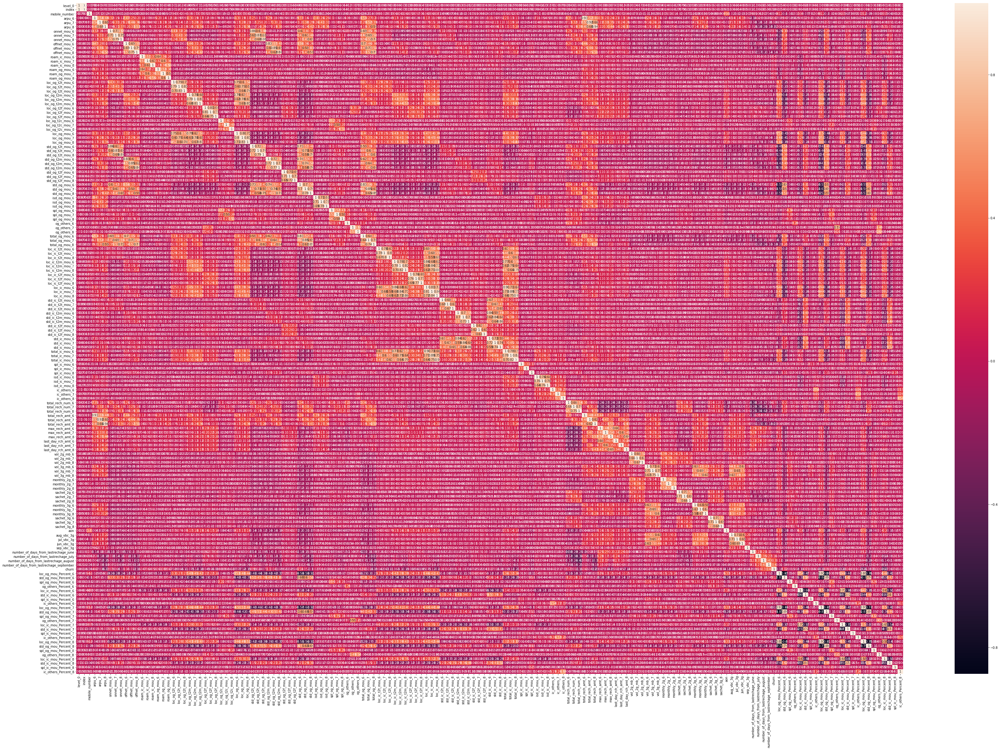

In [ ]:
# Now let's see the correlation matrix
plt.figure(figsize = (60,40))
sns.heatmap(churn_data.corr(),annot = True)

# Data Modelling and Data preparation 

In [ ]:
X = (churn_data.iloc[:,3:])
X = X.loc[:,X.columns != 'churn']
y = churn_data.loc[:, 'churn']

# Let's now standardise the data 
scaler = StandardScaler()
scaler.fit(X)

# Splitting of the data for test and train 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)

1.Basic Logistic Regression


[[7913  177]
 [ 429  448]]
Accuracy Score: 0.9324188691870191
AUC Score: 0.7444767601653575
ROC_AUC Score   0.926181653659726
Not-Churn Accuracy Rate:(Specificity) 0.9781211372064277
Churn Accuracy Rate:(Sensitivity) 0.5108323831242874


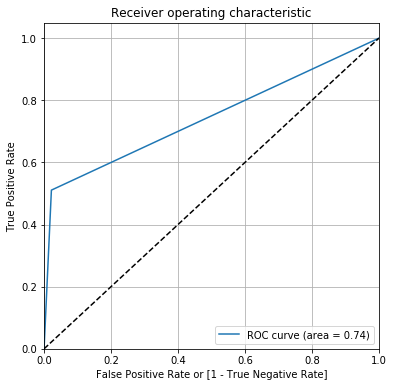

In [ ]:
lr = LogisticRegression()
lr.fit(X_train, y_train) 
y_pred = lr.predict(X_test)
model_evaluation(y_test, y_pred, lr)


2. Logistic Regression Using PCA 

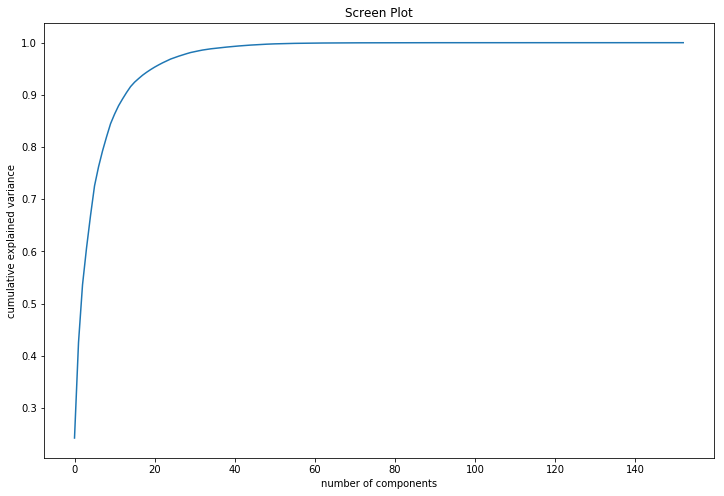

array([[ 7.81775298e-02,  1.05251838e-01,  1.00492557e-01, ...,
         2.91598149e-03,  1.50663552e-06,  3.62880760e-06],
       [ 1.24904860e-01,  1.49476852e-01,  1.49635135e-01, ...,
         4.90198954e-06, -4.10053038e-07,  6.24223646e-06],
       [-7.68420916e-02, -8.87042416e-02, -1.20206108e-01, ...,
         4.77757930e-03,  2.90046695e-05,  6.31657381e-05],
       ...,
       [-2.91555891e-08,  9.84455980e-08, -1.99300460e-07, ...,
        -6.25773813e-06, -1.35803685e-05,  3.34460670e-05],
       [ 2.50555758e-07, -1.54138365e-07,  4.16331053e-08, ...,
        -1.13724901e-06, -1.39073675e-06,  3.02551883e-06],
       [-2.15305817e-07,  1.68732839e-08,  3.16934670e-08, ...,
        -2.07967698e-06,  1.50179736e-05, -6.76848444e-06]])

In [ ]:
pca = PCA(svd_solver='randomized', random_state=42)
# Constructing a PCA using training data
pca.fit(X_train)

#Making the screeplot - plotting the cumulative variance against the number of components
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title("Screen Plot")
plt.show()
pca.components_

The insights are with 25 features the pca can get get 95% accuracy

3.Again PCA with 25 features

max corr:  0.005051408885921272
min corr: -0.00989533284552569


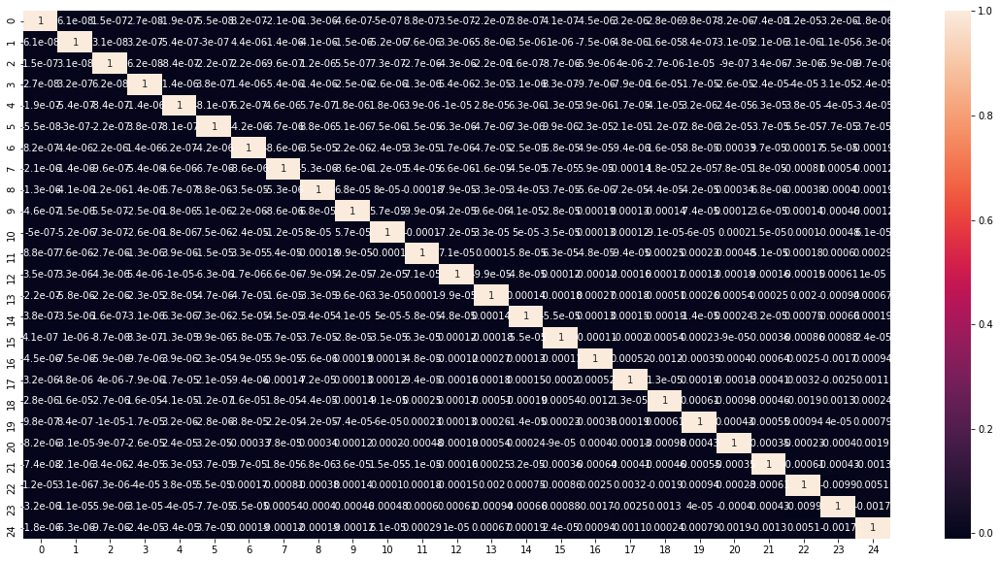

In [ ]:
# Now We will be using the increemental PCA to increase the efficiency
pca_final = IncrementalPCA(n_components=25)
pca_train_data_frame = pca_final.fit_transform(X_train)
#creating correlation matrix for the principal components
corrmat = np.corrcoef(pca_train_data_frame.transpose())
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (20,10))
sns.heatmap(corrmat,annot = True)
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:  " + str(corrmat_nodiag.max()))
print("min corr: "+str(corrmat_nodiag.min()))

  Now we are fitting the test data with the same pca model and run lr

4.Using Random forest with default parameters 

[[7967  123]
 [ 478  399]]
Accuracy Score: 0.9329764692762351
AUC Score: 0.7198780678597252
ROC_AUC Score   0.9160204540425347
Not-Churn Accuracy Rate:(Specificity) 0.984796044499382
Churn Accuracy Rate:(Sensitivity) 0.4549600912200684


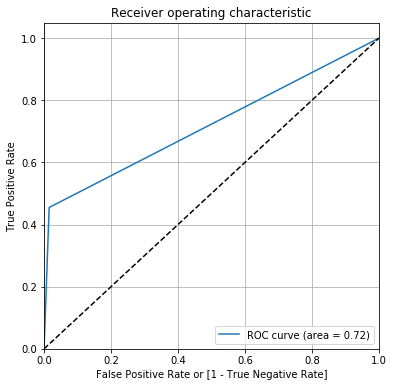

In [ ]:
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

# Here we go for the predictions 
y_pred = rfc.predict(X_test)
model_evaluation(y_test, y_pred, rfc)


Here we go for tuning the Random Forest's Hyper parameters 
1.max depth

In [ ]:
parameters = {'max_depth': range(2,30, 5)}
rfTuning(parameters, X_train, y_train)

2. n estimators 

In [ ]:
# finding the number of tree
parameters = {'n_estimators': range(100, 1500, 400)}
rfTuning(parameters, X_train, y_train)

3. max feature 

In [ ]:
# The maximum number of features to spilt a node
parameters = {'max_features': [4, 8, 14, 20, 24, 28, 32]}
rfTuning(parameters, X_train, y_train)

4. min samples leaf 

In [ ]:
parameters = {'min_samples_leaf': range(50, 400, 40)}
rfTuning(parameters, X_train, y_train)

5. min samples split 

In [ ]:
parameters = {'min_samples_split': range(200, 500, 50)}
rfTuning(parameters, X_train, y_train)

Final random forest with all optimal parameters 

In [ ]:
rfc = RandomForestClassifier(bootstrap=True,
                             max_depth=17,
                             min_samples_leaf=50, 
                             min_samples_split=300,
                             max_features=28,
                             n_estimators=100)
# fitting the model
rfc.fit(X_train,y_train)

# Here we go for the predictions 
y_pred = rfc.predict(X_test)
model_evaluation(y_test, y_pred, rfc)

Since we have the imbalnced data, hence we have to handle using smote 

In [ ]:
sm = SMOTE()
X_train_sm, y_train_sm = sm.fit_sample(X_train, y_train.ravel())

5.PCA with SMOTE

In [ ]:
pca_again = PCA(0.99)
train_pca_data_frame = pca_again.fit_transform(X_train_sm)
train_pca_data_frame.shape

In [ ]:
logR = LogisticRegression()
pca_model = logR.fit(train_pca_data_frame,y_train_sm)

test_pca_data_frame = pca_again.transform(X_test)

# Here we go for the prediction on the test data
y_pred = pca_model.predict(test_pca_data_frame)
model_evaluation(y_test, y_pred, model_pca, 1)

Summary :
Now finally with the Synthetic Minority Over Sampling Technique and Principal Component Analysis Machine Learning, the best 
results we are getting with the ROC AUC 88% and churn prediction is 81.9% and not churn prediction is 80.3%

Suggestions 
when the customer recharges lesser amount than of june in july and august is likely to churn
when the customer makes out going calls less than 228 minutes, Hence we reommnent the telecom provider to give some offers.